## Preparation


### Load dependencies


In [178]:
from io import BytesIO
from typing import Any, Dict, List, Literal, Optional, Sequence, Tuple

import matplotlib.pyplot as plt
import mordred as md
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display
from matplotlib.patches import Patch, PathPatch, Rectangle
from numpy.typing import NDArray
from tqdm.auto import tqdm
from tqdm.contrib.concurrent import thread_map

from project_filtering import (
    BASE_DIR,
    DEFAULT_DATA_OFFSET,
    DEFAULT_DATA_OFFSETS,
    DEFAULT_THRESHOLD,
    DEFAULT_THRESHOLDS,
    SEED,
)
from project_filtering.calculations import (
    calc_delta_corr,
    calc_stats_basic_prediction,
    calc_stats_classification,
    calc_stats_classification_multi_model,
    calc_stats_groups,
    calc_stats_models,
    calc_stats_comparison,
    get_deltas,
    get_ground_truth,
    get_values,
)
from project_filtering.data_analysis import (
    HATCH_DICT,
    plot_binned_values,
    plot_delta_corr,
    plot_delta_correlations,
    plot_distribution_deltas,
    plot_group_sizes,
    plot_stats_classification,
    # plot_stats_class_curve_v_mpe,
    plot_stats_group,
    plot_stats_models,
)
from project_filtering.utils import load_predicted_df

In [ ]:
%load_ext autoreload
%autoreload 1
%aimport project_filtering.data_analysis
%aimport project_filtering.calculations

In [ ]:
BASE_DIR, SEED

(WindowsPath('D:/Research/project-filtering'), 42)

In [ ]:
MODEL_NAMES = ["cnn", "gnn", "fcd", "fcfp", "cb"]

In [ ]:
OUTPUT_FOLDER = BASE_DIR / "data" / "output"

In [9]:
sns.set_context("paper", font_scale=0.7)

### Descriptor-based


#### Noisy


In [10]:
synth_noisy_df = pd.read_csv(
    BASE_DIR / "data/processed/synthetic-dataset.csv", index_col=0, sep=";"
)
synth_noisy_df = synth_noisy_df.sort_values("smiles").reset_index(drop=True)

#### Clean


In [ ]:
synth_clean_df = pd.read_csv(
    BASE_DIR / "data/processed/synthetic-clean-dataset.csv", index_col=0, sep=";"
)
synth_clean_df = synth_clean_df.sort_values("smiles").reset_index(drop=True)

#### Shuffled


In [12]:
shuffled_dfs = {}
for file in (BASE_DIR / "data/processed/").glob("predicted-dataset-shuffle-*.csv"):
    shuffled_dfs[float(file.name.split("-")[3])] = load_predicted_df(
        file, model_names=MODEL_NAMES
    )
shuffled_dfs = dict(sorted(shuffled_dfs.items()))

#### Variable Addition


In [13]:
variable_add_dfs = {}
for j in [0.025, 0.04, 0.05, 0.075, 0.1, 0.15, 0.25]:
    temp_dict = {}
    for i in [0.5, 1, 2.5, 5, 10]:
        filename = BASE_DIR / f"data/processed/predicted-variable-mu-{j}-{i}-42.csv"
        try:
            temp_dict[i] = load_predicted_df(filename, model_names=MODEL_NAMES)
        except FileNotFoundError:
            print(f"{filename} not found")
            continue
    temp_dict = dict(sorted(temp_dict.items()))
    variable_add_dfs[j] = temp_dict

### QM9


#### Clean


In [14]:
qm9_clean = pd.read_csv(BASE_DIR / "data/processed/qm9-clean.csv", sep=";")
qm9_clean["values"] = qm9_clean["g298_atom"] / (-1000)

#### Shuffled


In [15]:
qm9_shuffled_dfs = {}
for i in [0.0, 0.5, 1, 2.5, 5, 10]:
    filename = BASE_DIR / f"data/processed/qm9-shuffle-predictions-{i}-42.csv"
    try:
        qm9_shuffled_dfs[i] = load_predicted_df(filename, model_names=MODEL_NAMES)
    except FileNotFoundError:
        print(f"{filename} not found")
        continue
qm9_shuffled_dfs = dict(sorted(qm9_shuffled_dfs.items()))

#### Variable Addition


In [16]:
qm9_var_add_dfs = {}
for j in [0.0075, 0.0125, 0.015, 0.0175, 0.02, 0.025, 0.05, 0.08, 0.15, 0.25]:
    temp_dict = {}
    for i in [0.5, 1, 2.5, 5, 10]:
        filename = (
            BASE_DIR / f"data/processed/qm9-variable-mu-predictions-{j}-{i}-42.csv"
        )
        try:
            temp_dict[i] = load_predicted_df(filename, model_names=MODEL_NAMES)
        except FileNotFoundError:
            print(f"{filename} not found")
            continue
    temp_dict = dict(sorted(temp_dict.items()))
    qm9_var_add_dfs[j] = temp_dict

### GNN


In [17]:
gnn_df = pd.concat(
    [
        pd.read_csv(
            BASE_DIR / "data/processed/predicted-GNN-only-shuffle-42-46-2.5.csv",
            index_col=[0, 1],
            sep=";",
        ),
        pd.read_csv(
            BASE_DIR / "data/processed/predicted-GNN-only-shuffle-47-52-2.5.csv",
            index_col=[0, 1],
            sep=";",
        ),
    ]
)
gnn_df["gnn"] = [float(x.strip("[]")) for x in gnn_df["gnn"].to_numpy()]
gnn_df = (
    gnn_df.reset_index(names=["seed", "idx"])
    .pivot(index=["smiles", "inchi"], columns=["seed"], values=["gnn", "values"])
    .reset_index()
)

gnn_df.set_index(["smiles", "inchi"], append=True).stack(future_stack=True)
gnn_df.columns = [f"{x}-{y}" if y else str(x) for (x, y) in gnn_df.columns]
gnn_df["values"] = gnn_df["values-42"]
gnn_df = gnn_df.drop(columns=[x for x in gnn_df.columns if "values-" in x])
gnn_df = gnn_df.sort_values("smiles")
gnn_models = [x for x in gnn_df.columns if x.startswith("gnn")]

### FCFP


In [18]:
shuffle_comp = load_predicted_df(
    BASE_DIR / "data/processed/predicted-dataset-shuffle-2.5-42.csv",
    model_names=MODEL_NAMES,
)
fcfp_df = pd.read_csv(
    BASE_DIR / "data/processed/predicted-FCFP-only-shuffle-42-51-2.5.csv",
    index_col=[0, 1],
    sep=";",
)
fcfp_df["fcfp"] = [float(x.strip("[]")) for x in fcfp_df["fcfp"].to_numpy()]
fcfp_df = (
    fcfp_df.reset_index(names=["seed", "idx"])
    .pivot(index=["smiles", "inchi"], columns=["seed"], values=["fcfp", "values"])
    .reset_index()
)
fcfp_df.columns = [f"{x}-{y}" if y else str(x) for (x, y) in fcfp_df.columns]
fcfp_df["values"] = fcfp_df["values-42"]
fcfp_df = fcfp_df.drop(columns=[x for x in fcfp_df.columns if "values-" in x])
fcfp_df = fcfp_df.sort_values("smiles")
fcfp_models = [x for x in fcfp_df.columns if x.startswith("fcfp")]

### METLIN SMRT


In [19]:
metlin_df = pd.read_csv(BASE_DIR / "data/input/metlin-predicted-rts-1.csv", index_col=0)
metlin_models = metlin_df.columns[:-2].to_list()

### NIST RI 2017


In [20]:
nist_df = pd.read_csv(BASE_DIR / "data/input/nist-predicted-1.csv")
nist_models = nist_df.columns[3:].to_list()

## Methods


### Datasets


Figure S1


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


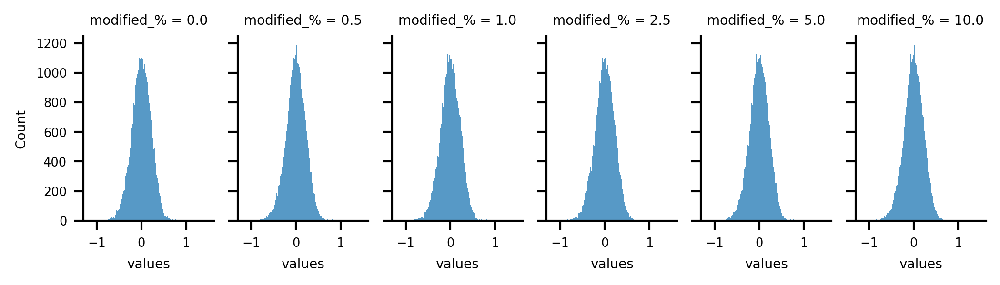

In [34]:
plot_df = pd.concat(
    shuffled_dfs.values(), keys=shuffled_dfs.keys(), names=["modified_%"]
)
fg = sns.displot(
    data=plot_df,
    x="values",
    col="modified_%",
    row=None,
    height=2,
    aspect=0.5,
    edgecolor=None,
    lw=0,
)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S1.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S1.eps")

Figure S2


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


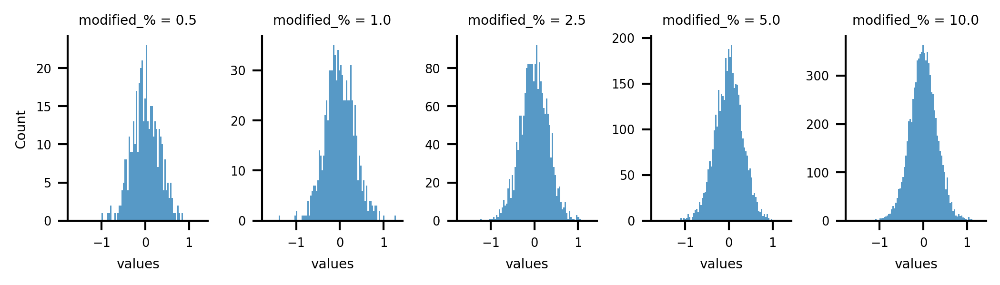

In [33]:
fg = plot_distribution_deltas(
    shuffled_dfs, synth_noisy_df, "values", height=2, aspect=0.5
)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S2.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S2.eps")

Figure S3


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


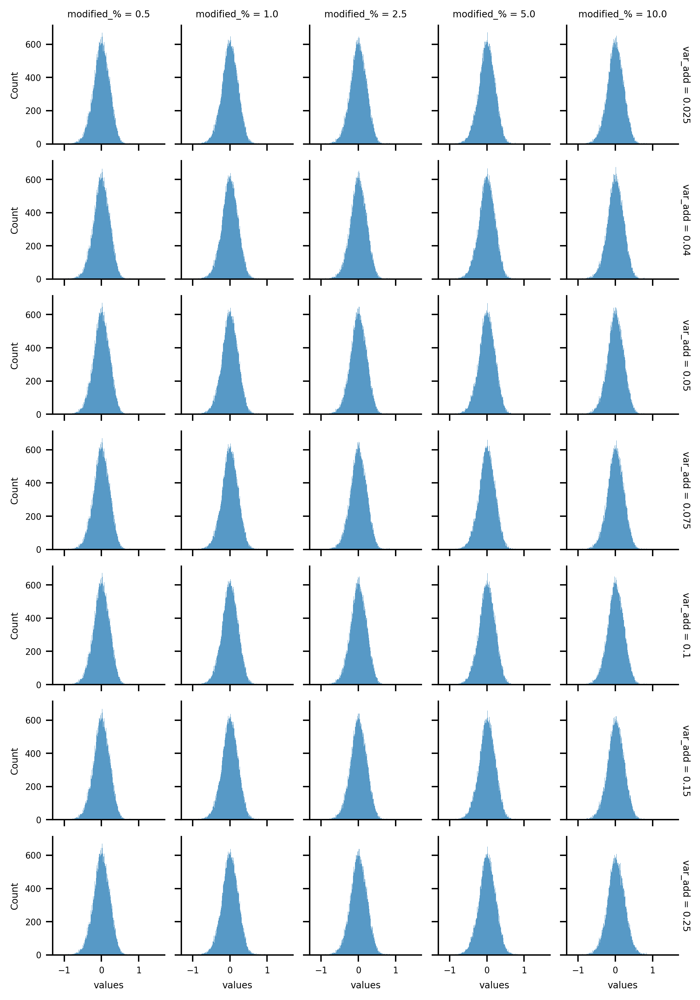

In [46]:
plot_df = pd.concat(
    {
        key: pd.concat(val.values(), keys=val.keys(), names=["modified_%"])
        for key, val in variable_add_dfs.items()
    },
    names=["var_add"],
)
fg = sns.displot(
    data=plot_df,
    x="values",
    col="modified_%",
    row="var_add",
    height=1.5,
    aspect=0.5,
    edgecolor=None,
    lw=0,
    facet_kws=dict(margin_titles=True),
)
fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S3.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S3.eps")

Figure S4


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


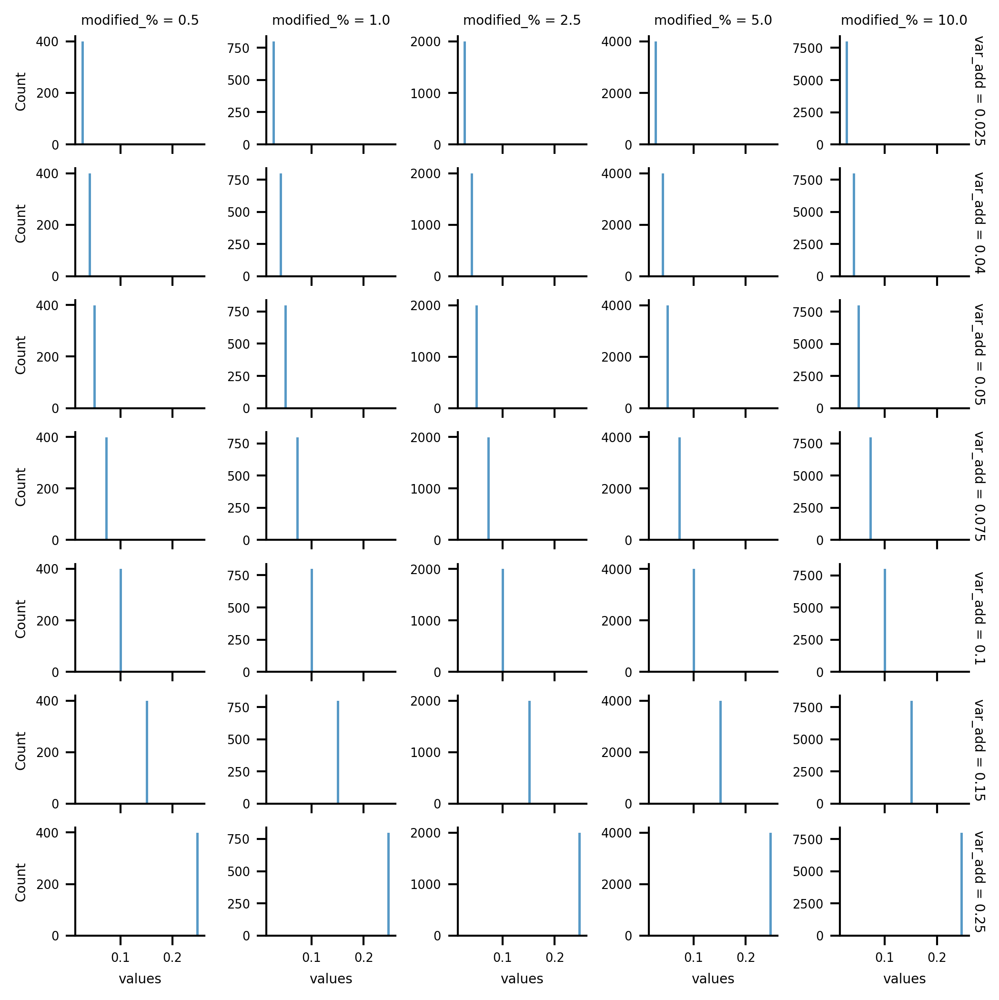

In [44]:
fg = plot_distribution_deltas(
    variable_add_dfs, synth_noisy_df, "values", margin_titles=True
)
fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S4.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S4.eps")

Figure S5


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


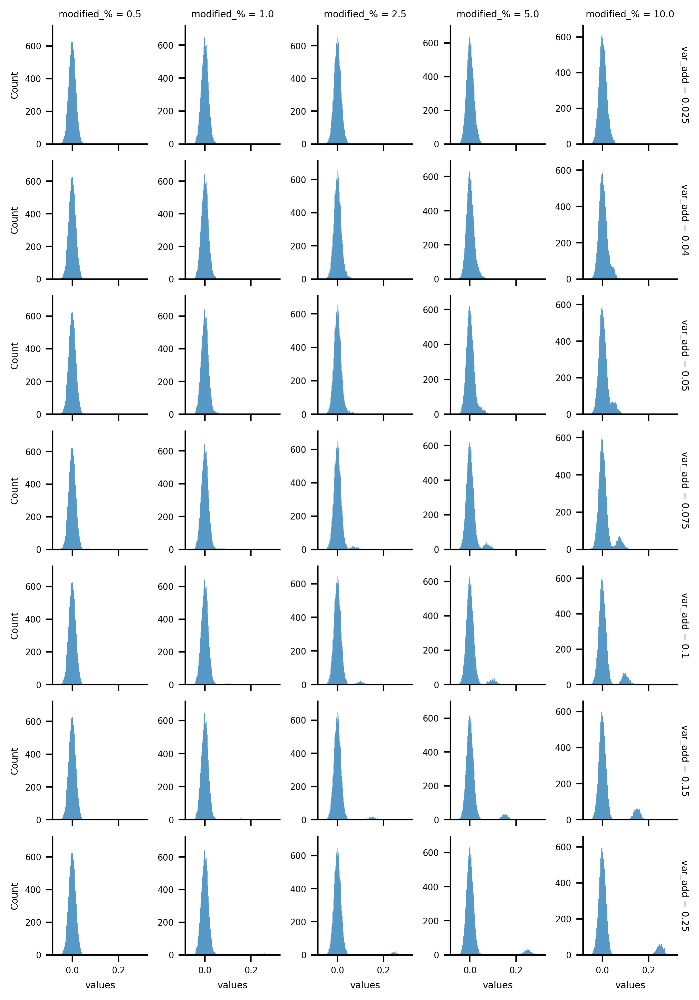

In [43]:
fg = plot_distribution_deltas(
    variable_add_dfs, synth_clean_df, "values", margin_titles=True
)
fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S5.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S5.eps")

Figure S6


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


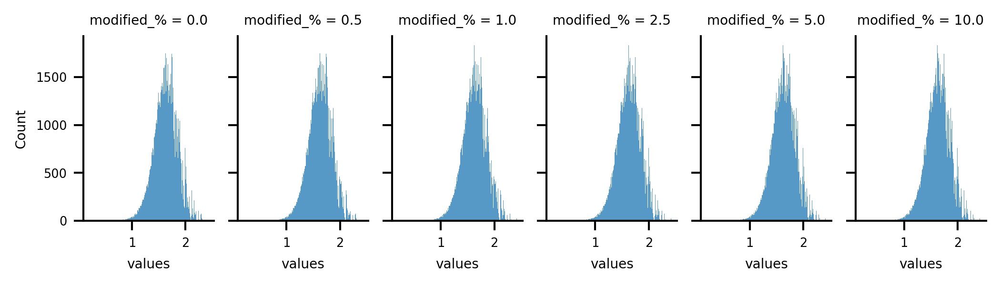

In [40]:
plot_df = pd.concat(
    qm9_shuffled_dfs.values(), keys=qm9_shuffled_dfs.keys(), names=["modified_%"]
)
fg = sns.displot(
    data=plot_df,
    x="values",
    col="modified_%",
    row=None,
    height=2,
    aspect=1,
    edgecolor=None,
    lw=0,
)
# fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S6.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S6.eps")

Figure S7


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


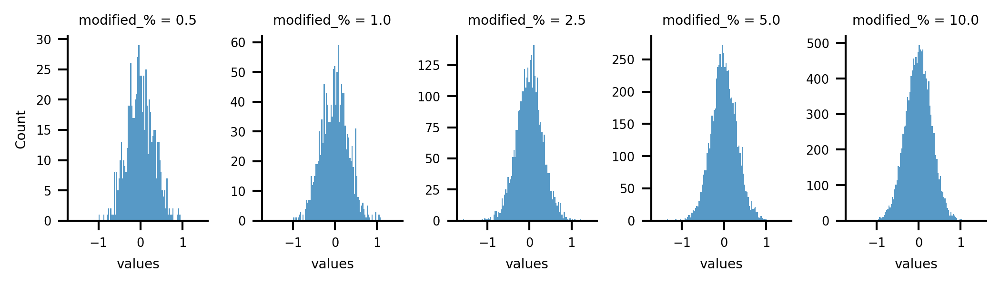

In [ ]:
fg = plot_distribution_deltas(
    qm9_shuffled_dfs, qm9_clean, "values", height=2, aspect=0.5
)
# fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S7.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S7.eps")

Figure S8


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


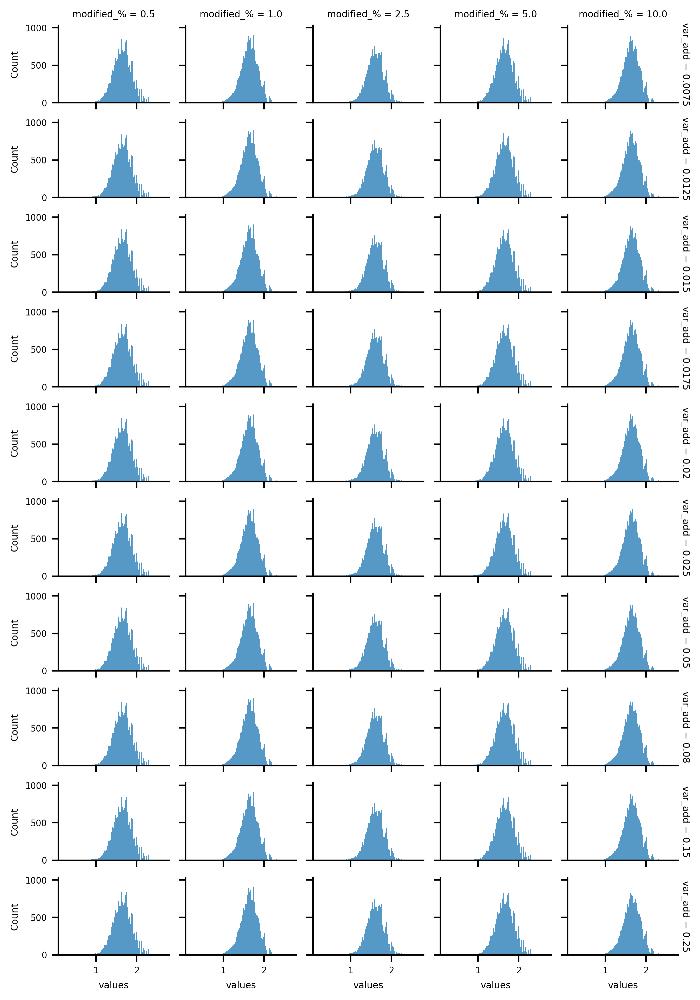

In [42]:
plot_df = pd.concat(
    {
        key: pd.concat(val.values(), keys=val.keys(), names=["modified_%"])
        for key, val in qm9_var_add_dfs.items()
    },
    names=["var_add"],
)
fg = sns.displot(
    data=plot_df,
    x="values",
    col="modified_%",
    row="var_add",
    height=2,
    aspect=0.5,
    edgecolor=None,
    lw=0,
    facet_kws=dict(margin_titles=True),
)
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S8.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S8.eps")

Figure S9


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


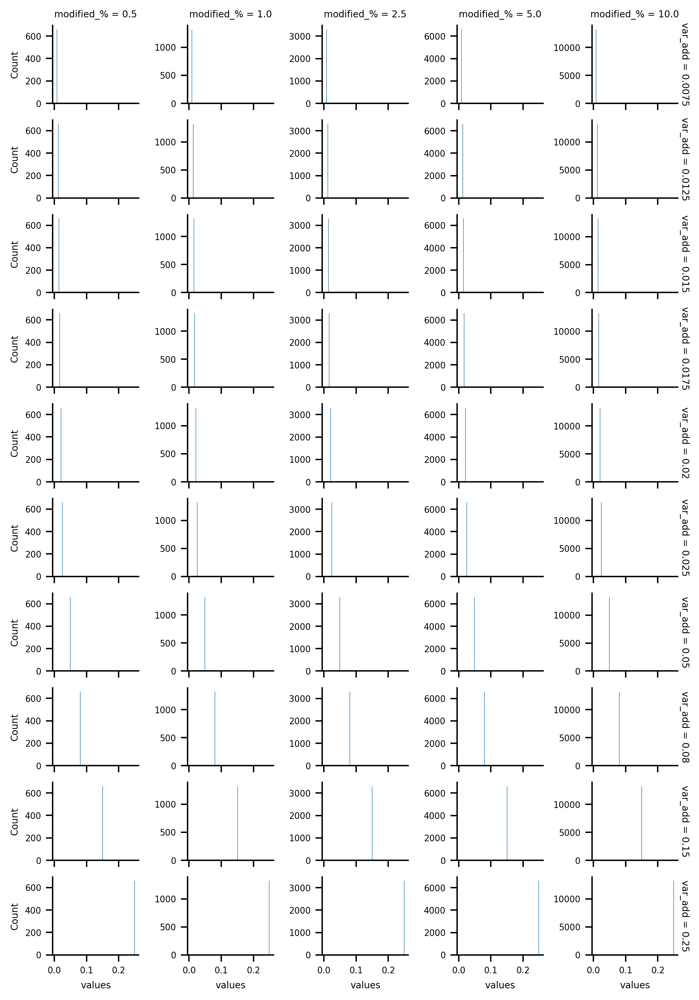

In [47]:
fg = plot_distribution_deltas(
    qm9_var_add_dfs, qm9_clean, "values", height=2, aspect=1, margin_titles=True
)
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S9.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S9.eps")

## Results and Discussion


### Impact of Errors in Training Datasets on Prediction Accuracy


Figure 1


array([3.34645669, 2.5       ])

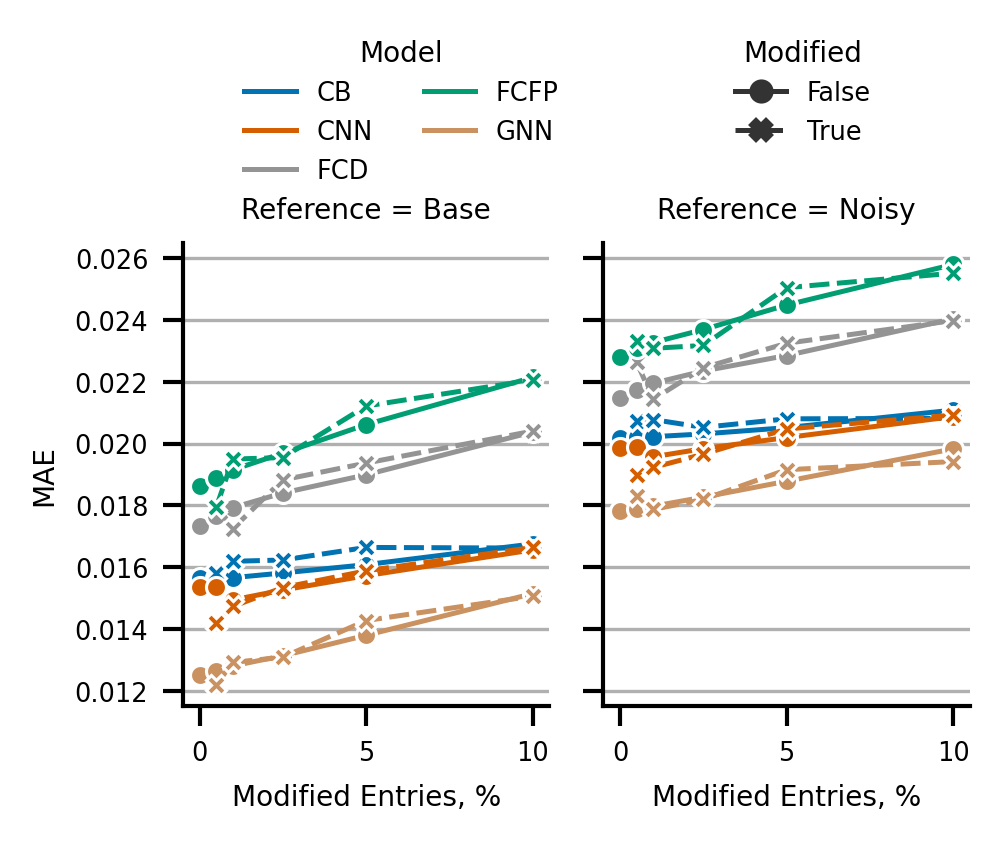

In [48]:
noisy_stats = calc_stats_models(
    dataframes=shuffled_dfs,
    clean_data=synth_noisy_df,
)
noisy_stats["modified"] = get_ground_truth(
    dataframes=shuffled_dfs, clean_dataframe=synth_noisy_df
)
clean_stats = calc_stats_models(
    dataframes=shuffled_dfs,
    clean_data=synth_clean_df,
)
clean_stats["modified"] = get_ground_truth(
    dataframes=shuffled_dfs, clean_dataframe=synth_noisy_df
)
plot_df = pd.concat({"Noisy": noisy_stats, "Base": clean_stats}, names=["Reference"])
plot_df["model_name"] = plot_df["model_name"].str.upper()
plot_df = plot_df.set_index(["model_name", "modified"], append=True)
plot_df.index.rename(
    ["Reference", "Modified Entries, %", "#", "Model", "Modified"], inplace=True
)
id_vars = ["Modified Entries, %", "Model", "Reference", "Modified"]
plot_df = plot_df.groupby(id_vars)["delta_abs"].mean().to_frame("MAE").reset_index()
# plot_df
sns.set_context("paper", font_scale=0.7)
fg = sns.relplot(
    data=plot_df,
    x="Modified Entries, %",
    y="MAE",
    style="Modified",
    row=None,
    col="Reference",
    hue="Model",
    kind="line",
    markers=True,
    palette="colorblind_reordered",
    height=2.5,
    aspect=0.6,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")

handles, labels = fg.axes[0, 0].get_legend_handles_labels()

# Separate by your variables
model_handles = [h for h, l in zip(handles, labels) if l in plot_df["Model"].unique()]
model_labels = [l for l in labels if l in plot_df["Model"].unique()]

mod_handles = [
    h for h, l in zip(handles, labels) if l in plot_df["Modified"].unique().astype(str)
]
mod_labels = [l for l in labels if l in plot_df["Modified"].unique().astype(str)]

# Remove the auto legend
fg.legend.remove()

# Add them back separately
fg.figure.legend(
    model_handles,
    model_labels,
    title="Model",
    loc="upper center",
    bbox_to_anchor=(0.4, 1.1),
    ncol=2,
    frameon=False,
)

fg.figure.legend(
    mod_handles,
    mod_labels,
    title="Modified",
    loc="upper center",
    bbox_to_anchor=(0.8, 1.1),
    ncol=1,
    frameon=False,
)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.savefig(BASE_DIR / "reports/figures/Figure_1.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_1.eps")
np.array(fg.figure.get_size_inches())
# fg.figure.get_tightbbox()

Figure S10


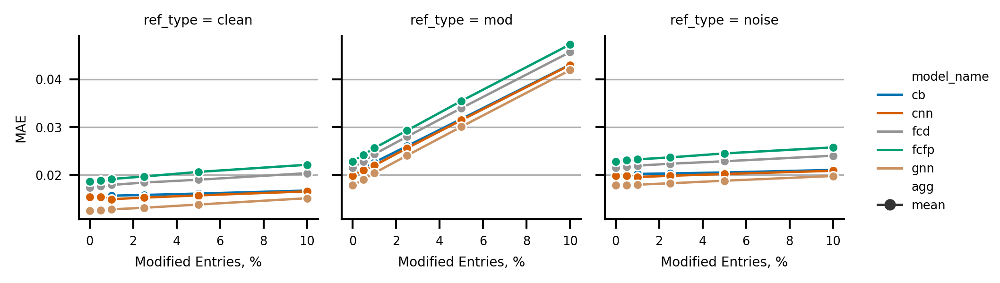

In [49]:
fg = plot_stats_models(
    dataframes=shuffled_dfs,
    clean_data=synth_noisy_df,
    original_data=synth_clean_df,
    model_names=MODEL_NAMES,
    data_offset=DEFAULT_DATA_OFFSET,
    x_var="modified_%",
    hue="model_name",
    col="ref_type",
    # style="modified",
    row=None,
    agg="mean",
    delta_type="delta_abs",
    split_modified=False,
    ignore_mod_df=False,
    facet_kws=dict(
        sharey="row",
    ),
    height=2,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")
fg.set_ylabels("MAE")
fg.set_xlabels("Modified Entries, %")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S10.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S10.eps")

Figure S11


[7.08661417 4.        ]


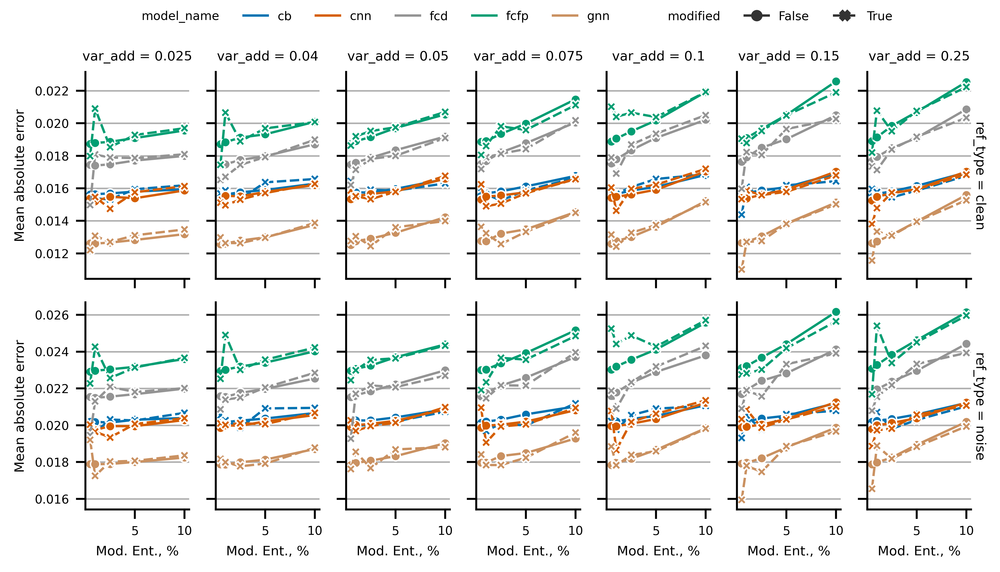

In [140]:
fg = plot_stats_models(
    dataframes=variable_add_dfs,
    clean_data=synth_noisy_df,
    original_data=synth_clean_df,
    model_names=MODEL_NAMES,
    data_offset=DEFAULT_DATA_OFFSET,
    x_var="modified_%",
    hue="model_name",
    row="ref_type",
    style="modified",
    col="var_add",
    agg="mean",
    delta_type="delta_abs",
    split_modified=True,
    ignore_mod_df=True,
    facet_kws=dict(sharey="row", margin_titles=True),
    height=2,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")
fg.set_ylabels("Mean absolute error")
fg.set_xlabels("Mod. Ent., %")
fg.figure.set_dpi(600)
fg.figure.set_figwidth(180 / 25.4)
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
sns.move_legend(fg, loc="upper center", ncols=10)
fg.tight_layout(rect=(0, 0, 1, 0.95))
print(fg.figure.get_size_inches())
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S11.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S11.eps")

Figure S12


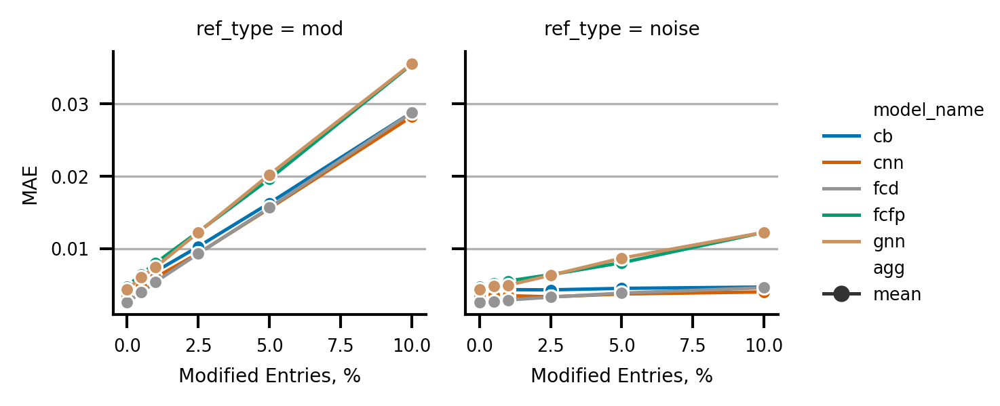

In [51]:
fg = plot_stats_models(
    dataframes=qm9_shuffled_dfs,
    clean_data=qm9_clean,
    # original_data=qm9_clean,
    model_names=MODEL_NAMES,
    data_offset=DEFAULT_DATA_OFFSET,
    x_var="modified_%",
    hue="model_name",
    col="ref_type",
    # style="modified",
    row=None,
    agg="mean",
    delta_type="delta_abs",
    split_modified=False,
    ignore_mod_df=False,
    facet_kws=dict(
        sharey="row",
    ),
    height=2,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")
fg.set_ylabels("MAE")
fg.set_xlabels("Modified Entries, %")
fg.figure.set_dpi(300)
# fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S12.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S12.eps")

### Correlations Between Errors of Predictions of the Models


Figure 2


array([3.34645669, 4.95      ])

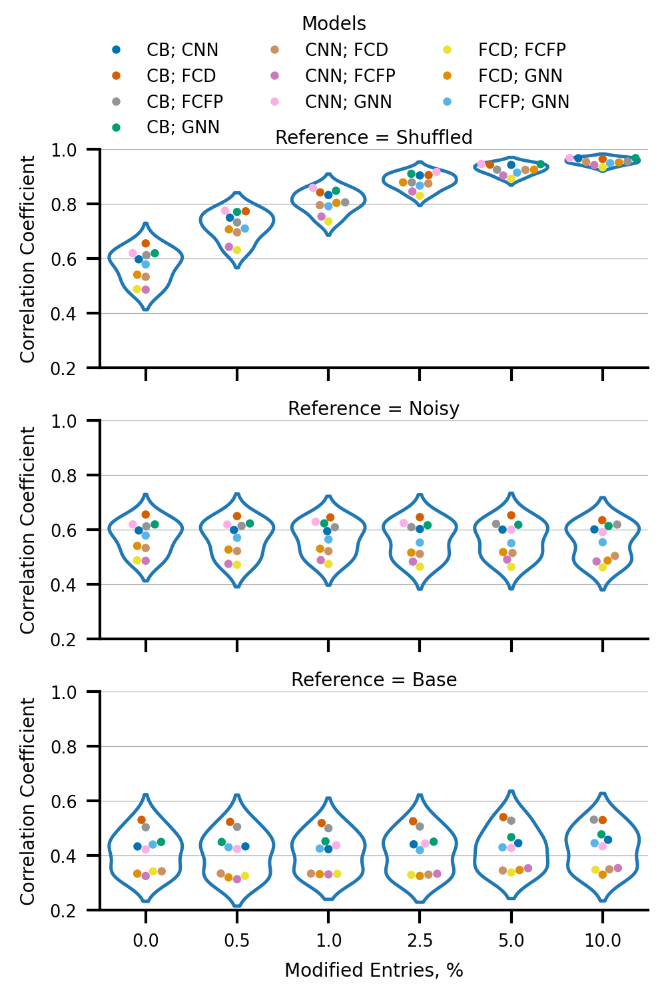

In [52]:
mod_corr = calc_delta_corr(dataframes=shuffled_dfs, clean_data=None, data_offset=1.5)
noisy_corr = calc_delta_corr(
    dataframes=shuffled_dfs, clean_data=synth_noisy_df, data_offset=1.5
)
clean_corr = calc_delta_corr(
    dataframes=shuffled_dfs, clean_data=synth_clean_df, data_offset=1.5
)
plot_df = pd.concat(
    {"Shuffled": mod_corr, "Noisy": noisy_corr, "Base": clean_corr}, names=["Reference"]
)
# plot_df = plot_df.set_index("Reference", append=True)

plot_df.columns.name = "model_name_2"
plot_df = plot_df.melt(ignore_index=False).reset_index(
    # level=-1
)
plot_df = plot_df[plot_df["model_name"] != plot_df["model_name_2"]]
plot_df["pair"] = plot_df[["model_name", "model_name_2"]].apply(
    lambda x: "; ".join(sorted(x)), axis=1
)
plot_df = plot_df.sort_values("pair")
plot_df["pair"] = plot_df["pair"].str.upper()
id_vars = ["modified_%", "pair", "Reference"]
id_vars = [x for x in id_vars if x in plot_df.columns]
plot_df = plot_df.drop_duplicates(id_vars)
plot_df = plot_df.drop(columns=["model_name", "model_name_2"])
plot_df.columns = [
    "Reference",
    "Modified Entries, %",
    "Correlation Coefficient",
    "Models",
]
sns.set_context("paper", font_scale=0.7)
fg = sns.FacetGrid(
    plot_df, row="Reference", col=None, height=1.65, aspect=2, sharey=True
)
fg.map_dataframe(
    sns.swarmplot,
    # sns.stripplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    hue="Models",
    palette="colorblind_reordered",
    s=3,
    # marker="_",
    # linewidth=2,
)
fg.map_dataframe(
    sns.violinplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    # hue="Reference",
    inner=None,
    fill=False,
    density_norm="width",
    # palette="colorblind_reordered",
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
    ax.set_title(y=0.975, label=ax.title.get_text(), pad=4)
fg.set(ylim=(0.2, 1.0))
fg.add_legend(title="Models")
sns.move_legend(fg, "upper center", ncols=3)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.figure.subplots_adjust(hspace=0.1, bottom=0.1)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.savefig(BASE_DIR / "reports/figures/Figure_2.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_2.eps")
np.array(fg.figure.get_size_inches())

Figure S13a


c:\Users\khris\AppData\Local\pypoetry\Cache\virtualenvs\project-filtering-ktHrqsC7-py3.12\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


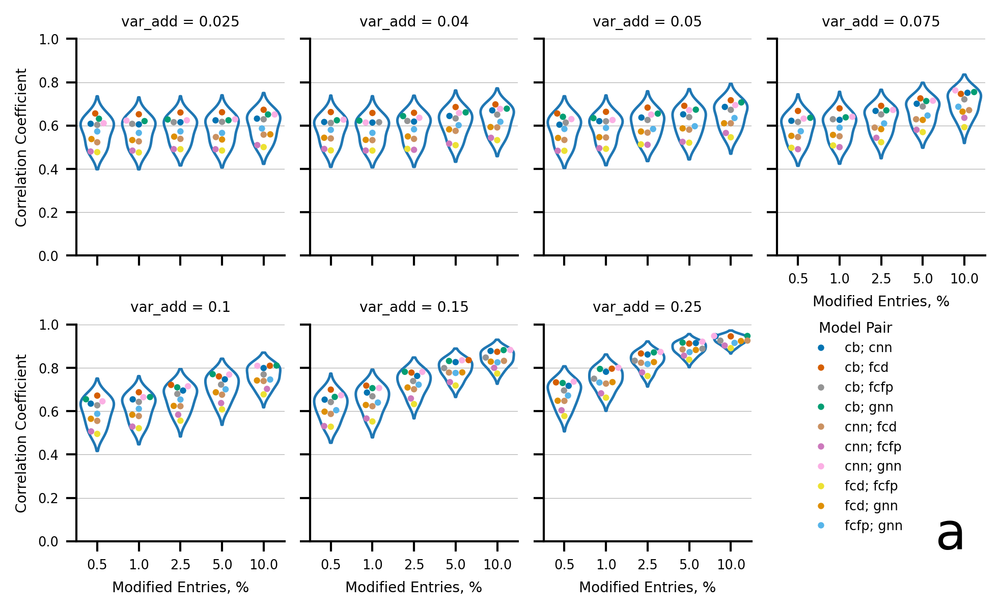

In [56]:
fg = plot_delta_correlations(variable_add_dfs, s=3, height=2, aspect=1.5, col_wrap=4)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.8, 0.3))
fg.figure.text(x=0.875, y=0.1, s="a", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13a.eps")

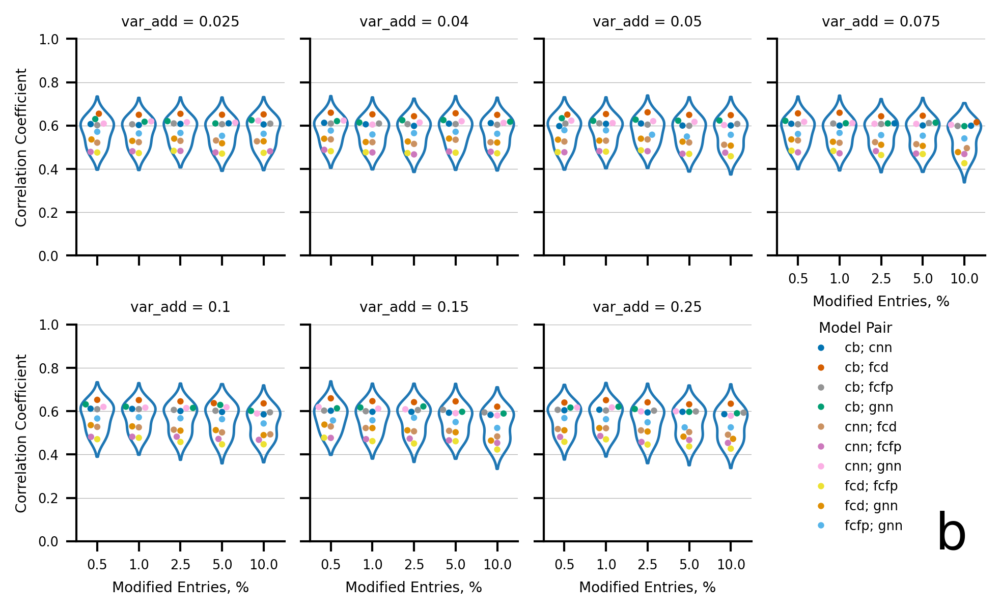

In [57]:
fg = plot_delta_correlations(
    variable_add_dfs, clean_data=synth_noisy_df, s=3, height=2, aspect=1.5, col_wrap=4
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.8, 0.3))
fg.figure.text(x=0.875, y=0.1, s="b", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13b.eps")

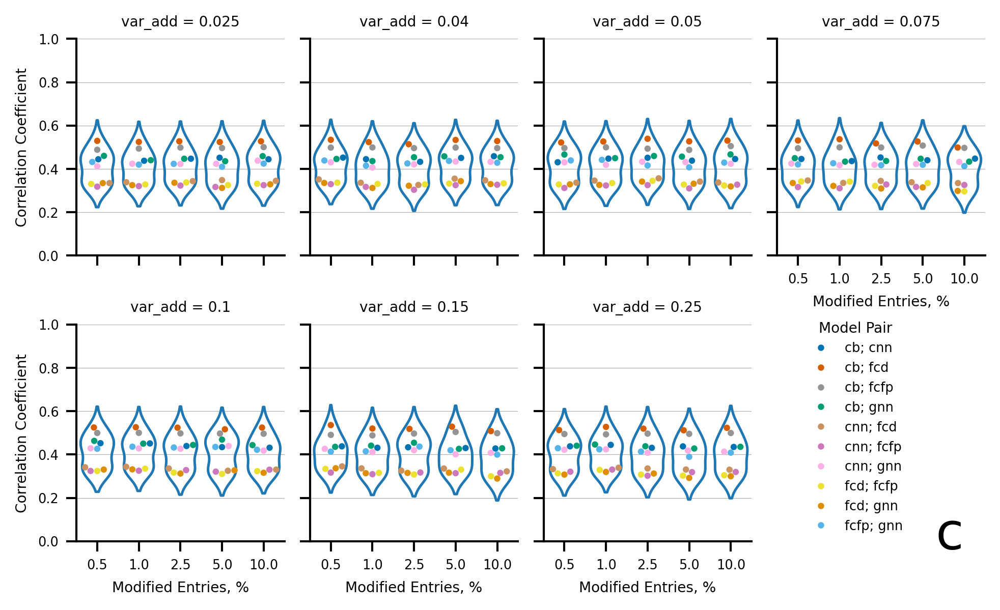

In [ ]:
fg = plot_delta_correlations(
    variable_add_dfs, clean_data=synth_clean_df, s=3, height=2, aspect=1.5, col_wrap=4
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.8, 0.3))
fg.figure.text(x=0.875, y=0.1, s="c", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13c.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13c.eps")

Figure S14


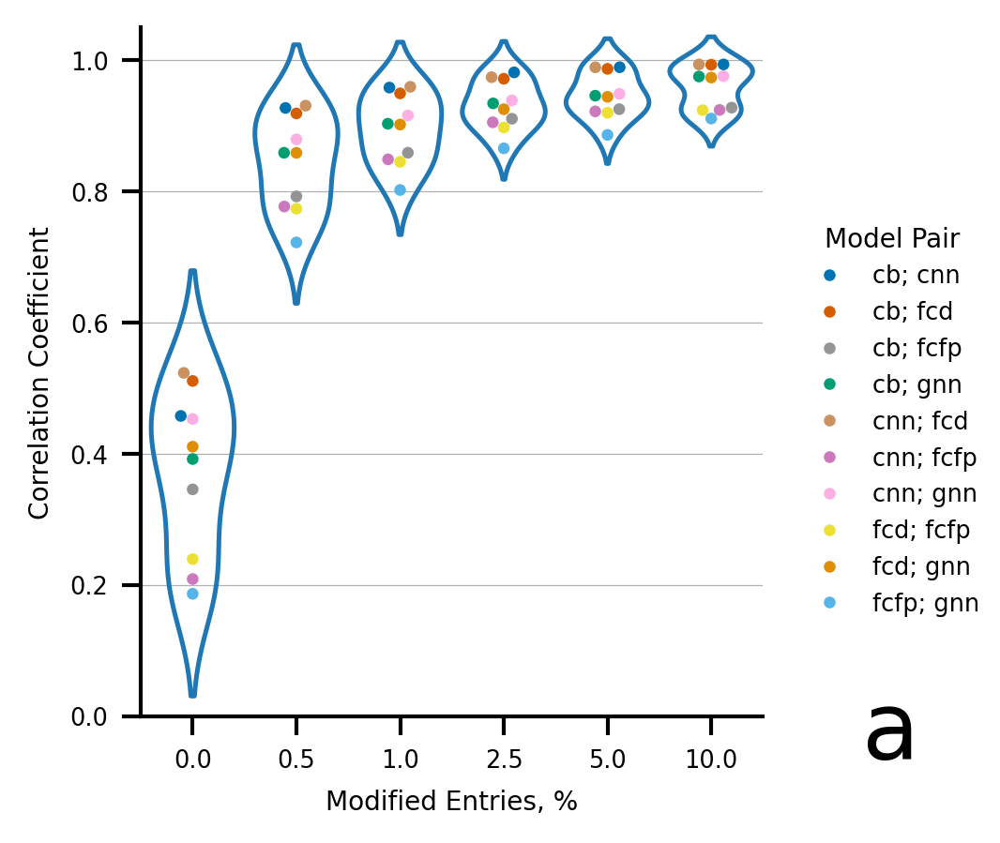

In [ ]:
fg = plot_delta_correlations(qm9_shuffled_dfs, s=3, height=3, aspect=1)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(3.5)
fg.figure.text(x=0.875, y=0.1, s="a", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14a.eps")

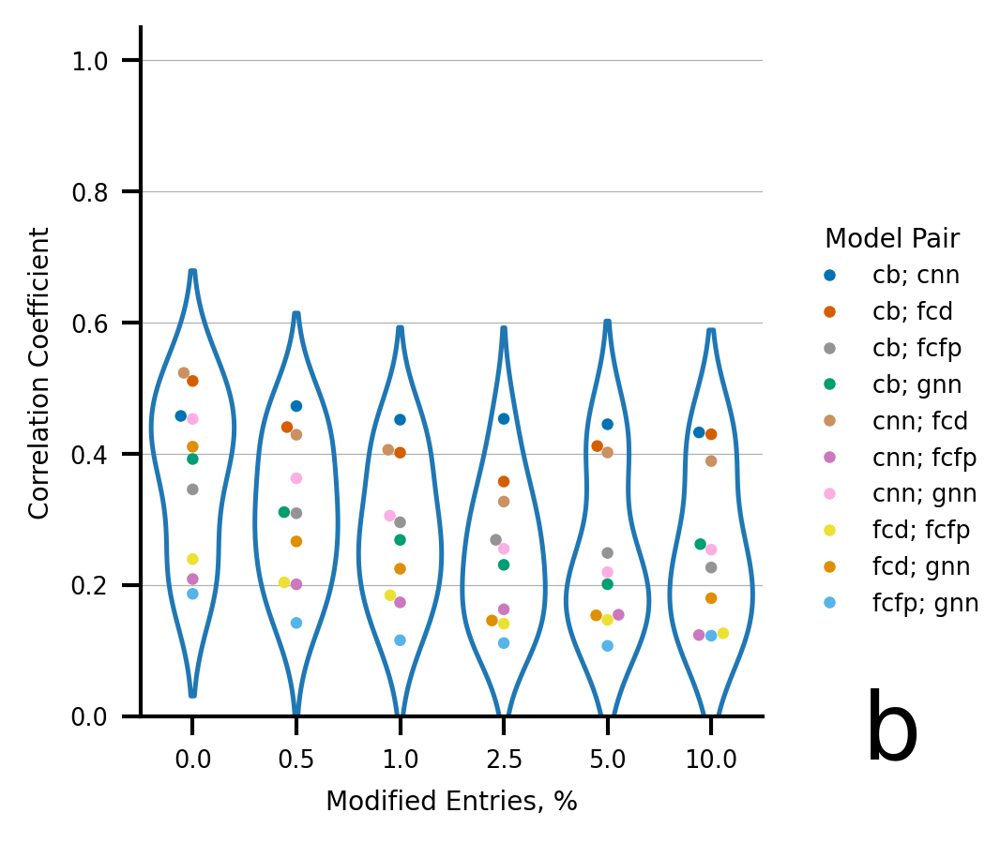

In [ ]:
fg = plot_delta_correlations(
    qm9_shuffled_dfs, clean_data=qm9_clean, s=3, height=3, aspect=1
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(3.5)
fg.figure.text(x=0.875, y=0.1, s="b", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14b.eps")

Figure S15


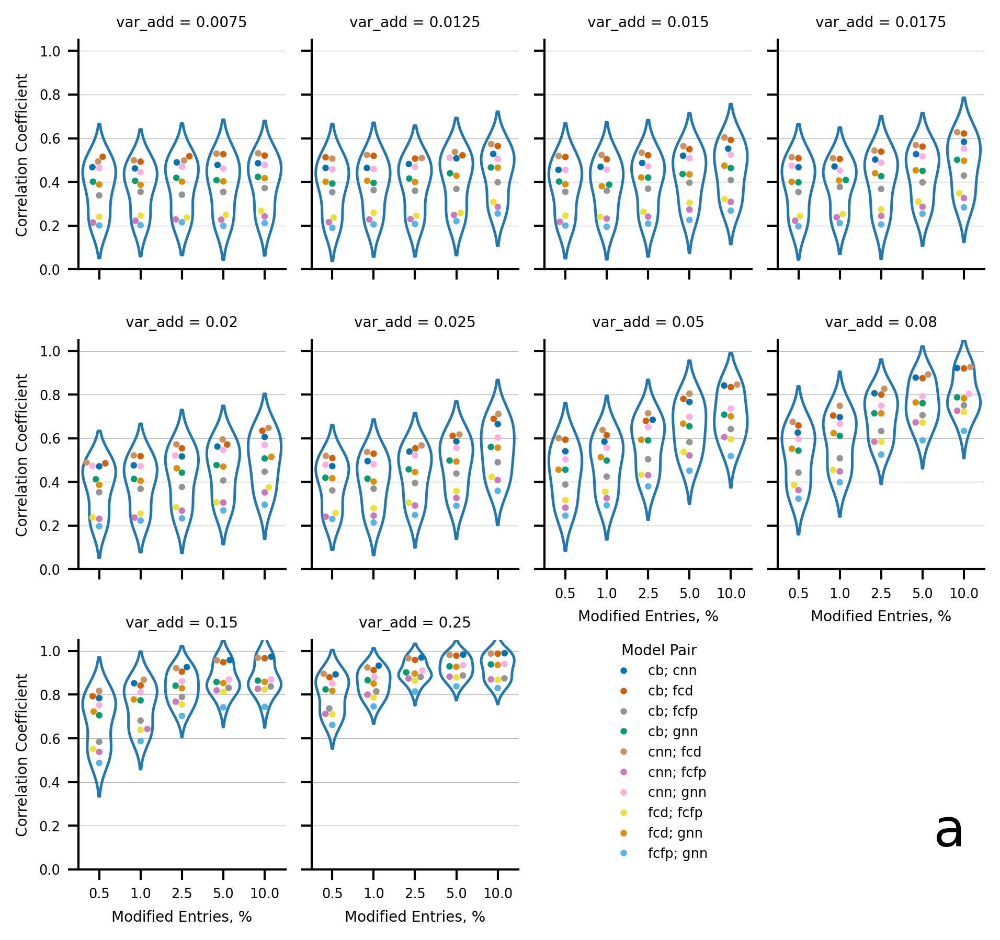

In [ ]:
fg = plot_delta_correlations(qm9_var_add_dfs, s=3, height=2, aspect=1, col_wrap=4)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.6, 0.2))
fg.figure.text(x=0.85, y=0.1, s="a", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15a.eps")

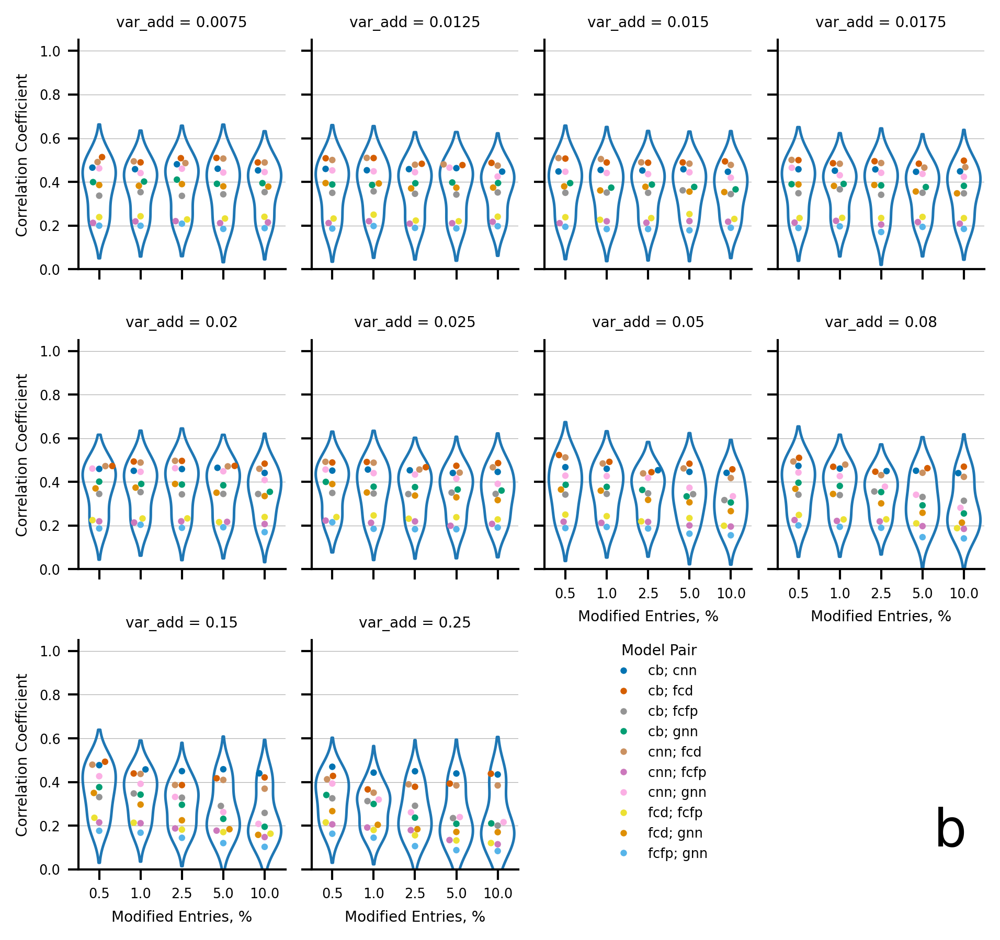

In [ ]:
fg = plot_delta_correlations(
    qm9_var_add_dfs, clean_data=qm9_clean, s=3, height=2, aspect=1, col_wrap=4
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.6, 0.2))
fg.figure.text(x=0.85, y=0.1, s="b", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15b.eps")

Figure S16


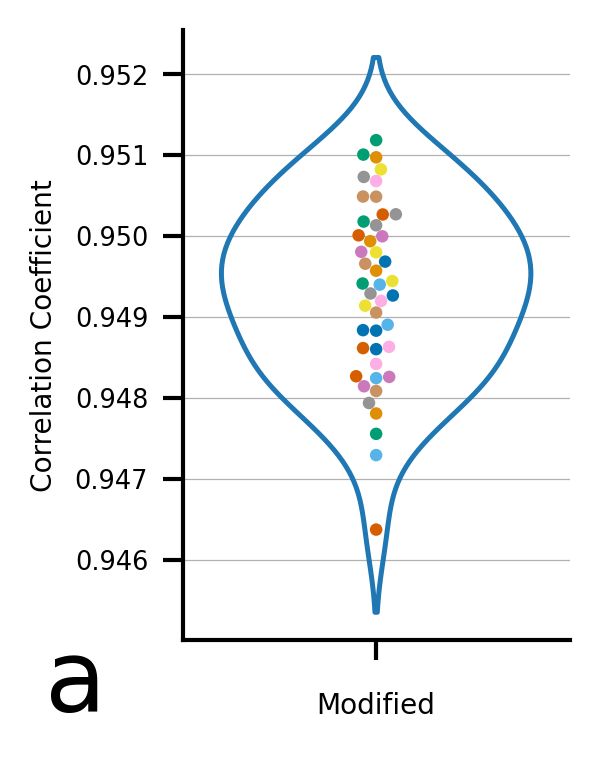

In [91]:
fg = plot_delta_correlations(
    gnn_df,
    model_names=gnn_models,
    x=None,
    s=3,
    height=2.5,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16a.eps")

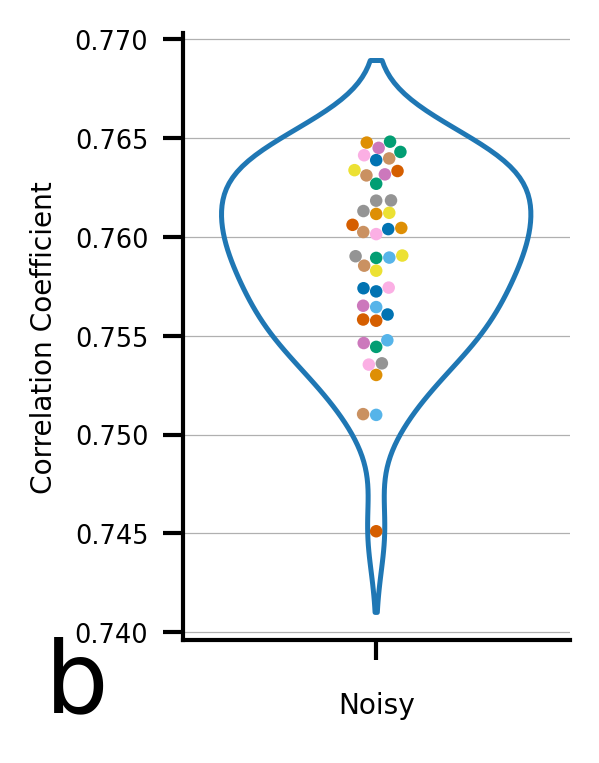

In [88]:
fg = plot_delta_correlations(
    gnn_df,
    clean_data=synth_noisy_df,
    model_names=gnn_models,
    x=None,
    s=3,
    height=2.5,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Noisy")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16b.eps")

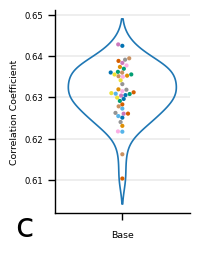

In [92]:
fg = plot_delta_correlations(
    gnn_df,
    clean_data=synth_clean_df,
    model_names=gnn_models,
    x=None,
    s=3,
    height=2.5,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Base")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="c", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16c.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16c.eps")

Figure S17


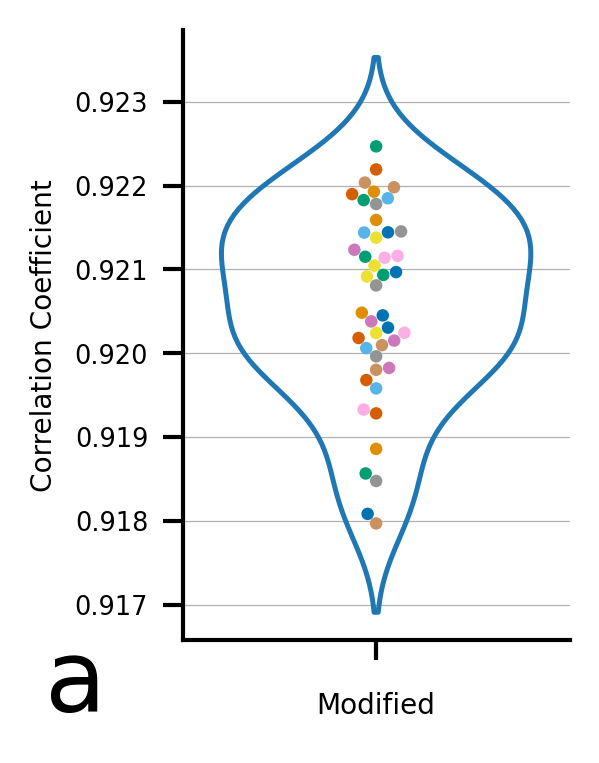

In [93]:
fg = plot_delta_correlations(
    fcfp_df,
    model_names=fcfp_models,
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17a.eps")

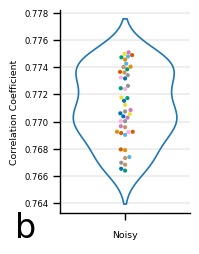

In [ ]:
fg = plot_delta_correlations(
    fcfp_df,
    clean_data=synth_noisy_df,
    model_names=fcfp_models,
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Noisy")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17b.eps")

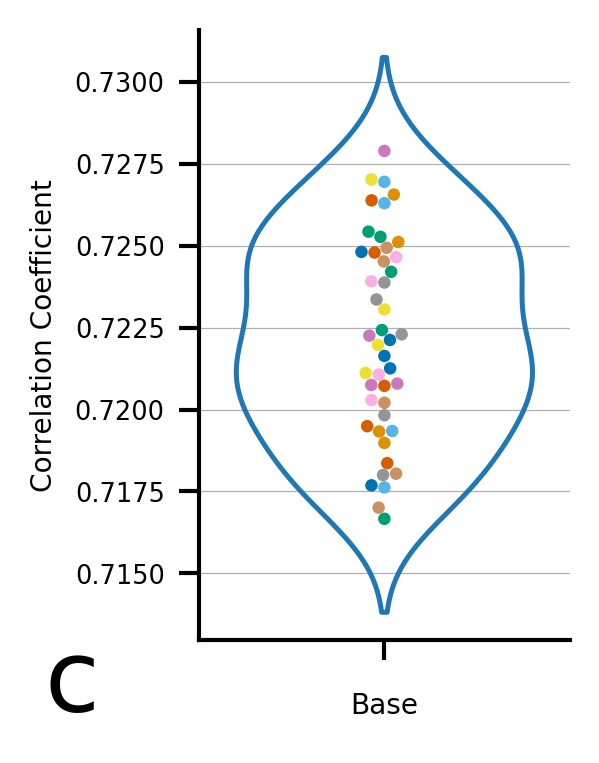

In [95]:
fg = plot_delta_correlations(
    fcfp_df,
    clean_data=synth_clean_df,
    model_names=fcfp_models,
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Base")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="c", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17c.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17c.eps")

Figure S18


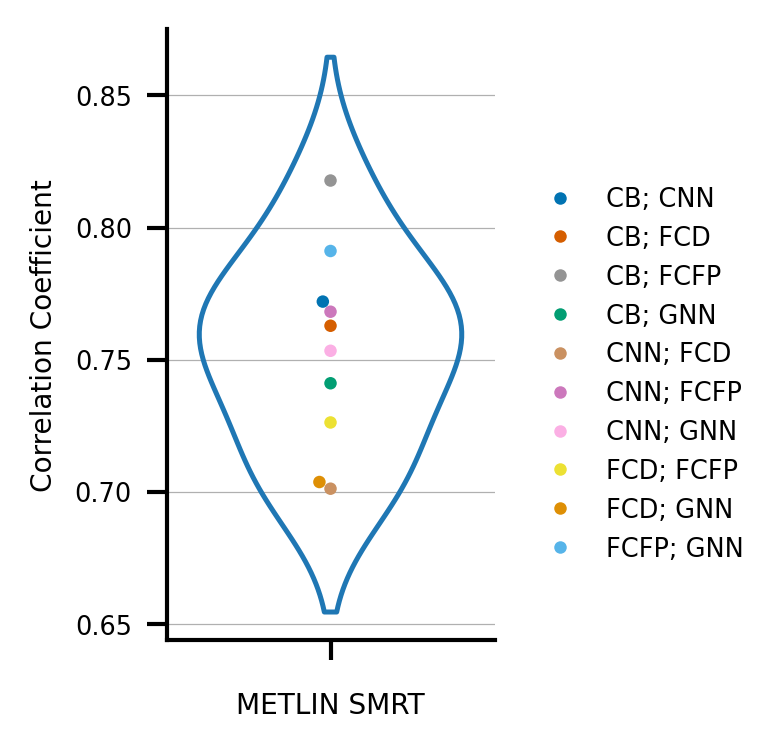

In [98]:
fg = plot_delta_correlations(
    metlin_df,
    model_names=metlin_models,
    value_name="EXP",
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("METLIN SMRT")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
# fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_figwidth(2.5)
fg.tight_layout(rect=(0, 0, 0.7, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S18.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S18.eps")

Figure S19


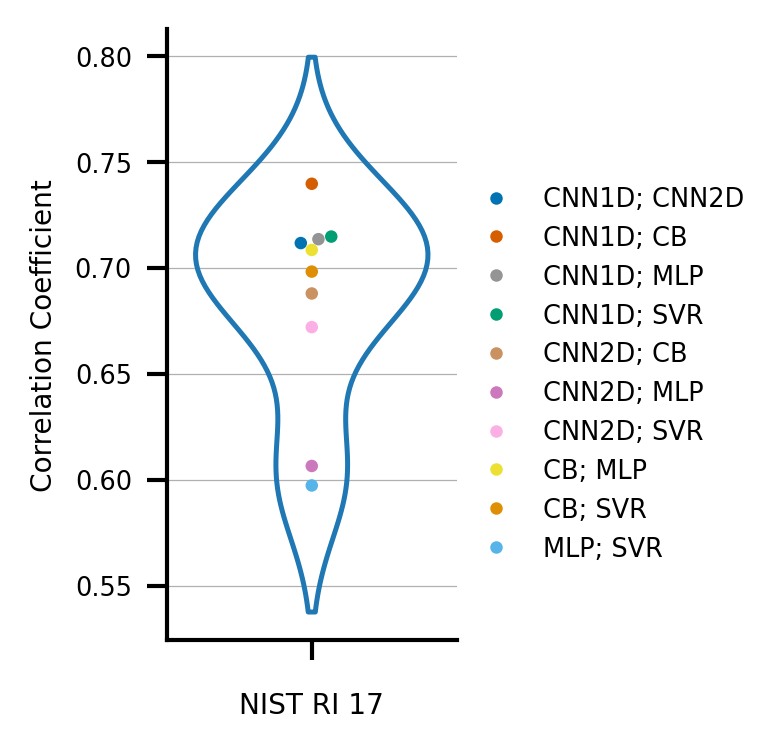

In [ ]:
fg = plot_delta_correlations(
    nist_df,
    model_names=nist_models,
    value_name="RI_X",
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("NIST RI 17")
fg.set_ylabels("Correlation Coefficient")
handles, labels = fg.ax.get_legend_handles_labels()
new_labels = []
for label in labels:
    new_labels.append(
        label.replace("RI_", "").replace("1D", "CNN1D").replace("2D", "CNN2D")
    )
fg.legend.remove()
fg.figure.legend(handles=handles, labels=new_labels, loc="right", frameon=False)
# fg.legend.set_title("Model Pair")
# fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_figwidth(2.5)
fg.tight_layout(rect=(0, 0, 0.65, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S19.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S19.eps")

### Single Architecture Performance: A Comparison to Mixture of Models


In [105]:
gnn_data = calc_stats_classification_multi_model(
    dataframes=gnn_df,
    clean_dataframe=synth_noisy_df,
    model_names=gnn_models,
    thresholds=np.geomspace(0.1, 100, 100),
)
fcfp_data = calc_stats_classification_multi_model(
    dataframes=fcfp_df,
    clean_dataframe=synth_noisy_df,
    model_names=fcfp_models,
    thresholds=np.geomspace(0.1, 100, 100),
)
mix_data = calc_stats_classification_multi_model(
    dataframes=shuffle_comp,
    clean_dataframe=synth_noisy_df,
    model_names=MODEL_NAMES,
    thresholds=np.geomspace(0.1, 100, 100),
)
gnn_data["models"] = "GNN"
mix_data["models"] = "MIX"
fcfp_data["models"] = "FCFP"
plot_data = pd.concat([gnn_data, fcfp_data, mix_data])
plot_data.columns = [
    "threshold_%",
    "# Models",
    "Precision",
    "Recall",
    "F1",
    "#",
    "#2",
    "#3",
    "Model Names",
    "Models",
]
from sklearn.metrics import auc

aucs = {
    "GNN": {},
    "FCFP": {},
    "MIX": {},
}

for i in range(1, 6):
    xs = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "MIX"), "Recall"
    ].to_numpy()
    ys = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "MIX"), "Precision"
    ].to_numpy()
    # ys = ys[np.argsort(xs)]
    # xs = xs[np.argsort(xs)]
    auc_val = auc(xs, ys)
    aucs["MIX"][i] = auc_val
    # print(i, auc_val)
for i in range(1, 11):
    xs = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "GNN"), "Recall"
    ].to_numpy()
    ys = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "GNN"), "Precision"
    ].to_numpy()
    # ys = ys[np.argsort(xs)]
    # xs = xs[np.argsort(xs)]
    auc_val = auc(xs, ys)
    aucs["GNN"][i] = auc_val
    # print(i, auc(xs, ys))
for i in range(1, 11):
    xs = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "FCFP"), "Recall"
    ].to_numpy()
    ys = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "FCFP"), "Precision"
    ].to_numpy()
    # ys = ys[np.argsort(xs)]
    # xs = xs[np.argsort(xs)]
    auc_val = auc(xs, ys)
    aucs["FCFP"][i] = auc_val
    # print(i, auc(xs, ys))
aucs = pd.DataFrame(aucs)
aucs_plot = aucs.melt(
    var_name="Models", value_name="AUCPRC", ignore_index=False
).reset_index(names=["# Models"])
aucs_plot = aucs_plot.loc[np.isin(aucs_plot["# Models"], [1, 5, 10]), :]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Figure 3


[2.80925 3.     ]
[(<matplotlib.lines.Line2D object at 0x00000250C9B4DBB0>, 'Models'), (<matplotlib.lines.Line2D object at 0x00000250CA79E630>, 'GNN'), (<matplotlib.lines.Line2D object at 0x000002506B606B40>, 'FCFP'), (<matplotlib.lines.Line2D object at 0x00000250695DCA10>, 'MIX'), (<matplotlib.lines.Line2D object at 0x00000250687B18E0>, '# Models'), (<matplotlib.lines.Line2D object at 0x00000250842DFE00>, '1'), (<matplotlib.lines.Line2D object at 0x00000250842DD040>, '5'), (<matplotlib.lines.Line2D object at 0x000002509AF31D00>, '10')]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


array([4.05320669, 3.        ])

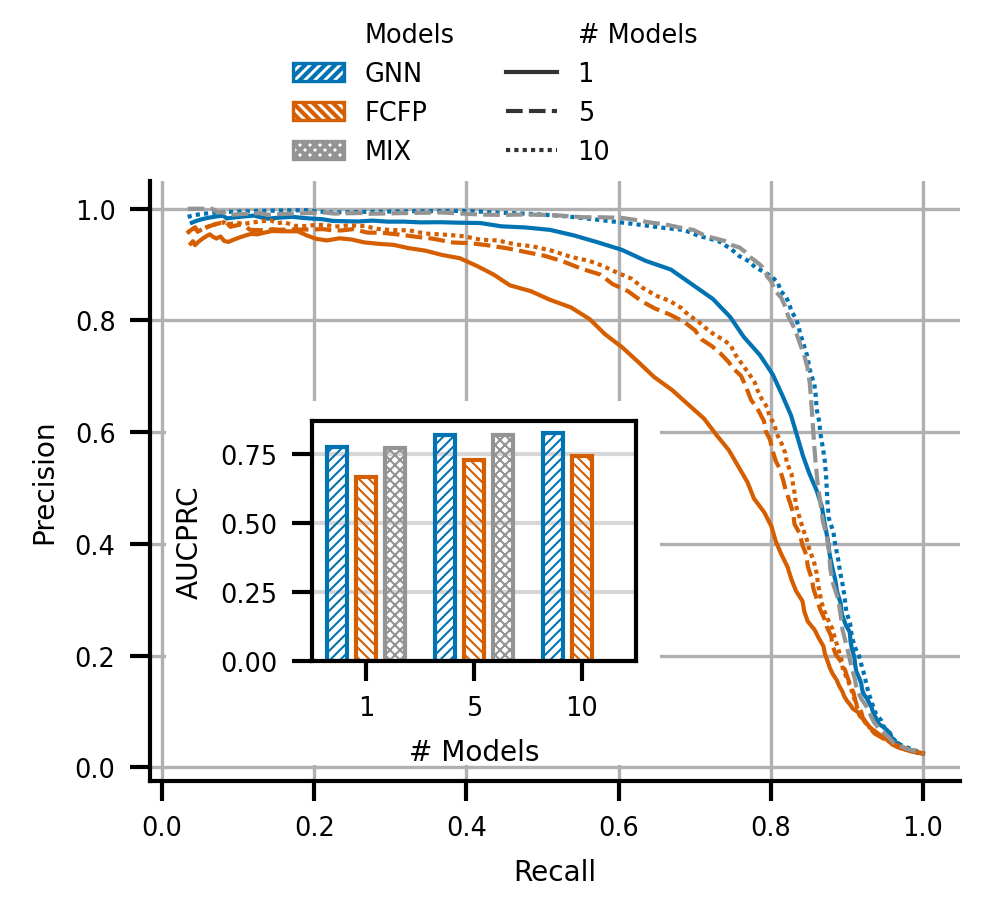

In [108]:
fg = sns.relplot(
    plot_data[
        ((plot_data["Models"] == "MIX") & (plot_data["# Models"] == 5))
        | (np.isin(plot_data["# Models"], [1, 10]) & (plot_data["Models"] == "GNN"))
        | (np.isin(plot_data["# Models"], [1, 5, 10]) & (plot_data["Models"] == "FCFP"))
    ],
    y="Precision",
    x="Recall",
    hue="Models",
    style="# Models",
    kind="line",
    markers=False,
    lw=1,
    height=3,
    aspect=0.7,
    palette="colorblind_reordered",
)
for ax in fg.axes.flatten():
    ax.grid(True)

print(fg.figure.get_size_inches())
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.85))

ax = fg.axes[0, 0]
axins = ax.inset_axes(
    (0.2, 0.2, 0.4, 0.4), frameon=True, facecolor="white", alpha=1, zorder=6
)
axins.grid(axis="y", lw=1, alpha=0.5)
axins.set_axisbelow(True)
bp = sns.barplot(
    data=aucs_plot,
    x="# Models",
    y="AUCPRC",
    hue="Models",
    palette="colorblind_reordered",
    ax=axins,
    legend=False,
    fill=False,
    dodge=True,
    gap=0.3,
    linewidth=1,
)

for patch in axins.patches:
    patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
    patch.set_hatch_linewidth(0.5)


ax.add_patch(
    Rectangle(
        (0.005, 0.005), 0.65, 0.65, facecolor="white", edgecolor=None, zorder=5
    )
)
handles, labels = fg.axes[0, 0].get_legend_handles_labels()
print(list(zip(handles, labels)))
patches = [
    (
        Patch(
            facecolor="white",
            edgecolor=h.get_color(),
            label=l,
            hatch=HATCH_DICT.get(h.get_color(), "****"),
            hatch_linewidth=0.5,
        )
        if str(l).isupper()
        else h
    )
    for (h, l) in zip(handles, labels)
]
fg.legend.remove()
fg.add_legend(handles=patches)
sns.move_legend(fg, "upper center", ncols=2)
fg.savefig(BASE_DIR / "reports/figures/Figure_3.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_3.eps")
np.array(fg.figure.get_size_inches())

### Distribution of Entries across Groups


Figure 4


[3.34645669 2.        ]


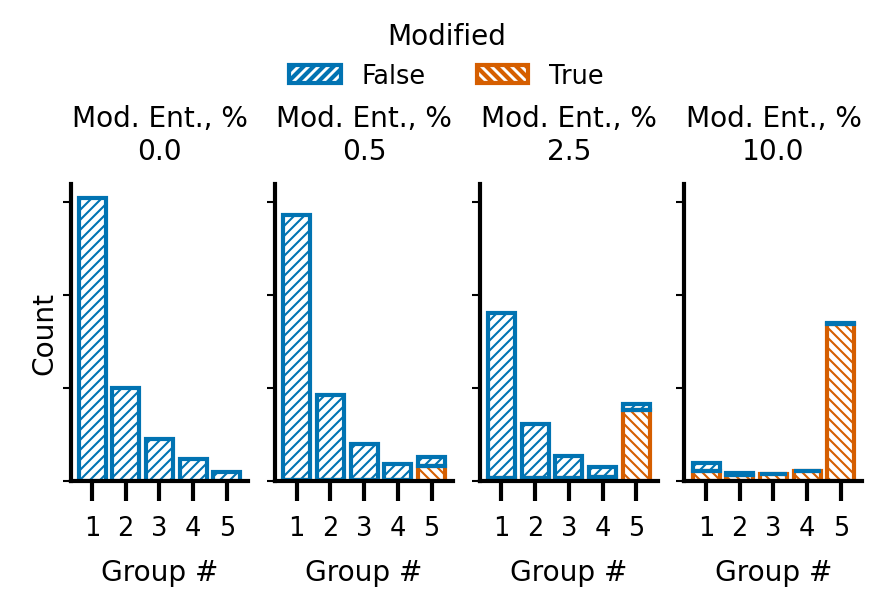

In [109]:
plot_df = calc_stats_groups(
    dataframes=shuffled_dfs,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
)
ground_truth = get_ground_truth(dataframes=shuffled_dfs, clean_dataframe=synth_noisy_df)
plot_df = pd.concat([plot_df, ground_truth], axis=1)
plot_df = plot_df.set_index("modified", append=True)
# all_df = plot_df
# mod_df = plot_df.xs(True, level="modified", drop_level=False)
# plot_df = pd.concat({"All": all_df, "Modified": mod_df}, names=["Type"])
plot_df = plot_df.reset_index().drop(columns=["s_5_a", "s_5_r", "s_5_n"])
plot_df.columns = ["Mod. Ent., %", "#", "Modified", "Group #"]
plot_df = plot_df.loc[np.isin(plot_df["Group #"], np.arange(1, 6)), :]
plot_df = plot_df.loc[np.isin(plot_df["Mod. Ent., %"], [0, 0.5, 2.5, 10]), :]
fg = sns.displot(
    data=plot_df,
    x="Group #",
    col="Mod. Ent., %",
    hue="Modified",
    kind="hist",
    fill=False,
    shrink=0.8,
    element="bars",
    multiple="stack",
    discrete=True,
    linewidth=1,
    height=2,
    aspect=0.3,
    palette="colorblind_reordered",
)

for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)


handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)


fg.set_titles(
    row_template="{row_var}\n{row_name}", col_template="{col_var}\n{col_name}"
)
sns.move_legend(fg, "upper center", ncols=3)
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.figure.set_dpi(300)
fg.set_yticklabels([])
fg.set(xticks=(np.arange(1, 6).astype(int)))
fg.figure.subplots_adjust(wspace=0.15)
fg.set_ylabels(labelpad=0)
fg.tick_params(axis="y", pad=1, width=0.5, length=2)
fg.set(
    ylim=(
        0,
        1.05
        * plot_df.loc[plot_df["Group #"] == 1, :]
        .groupby(["Mod. Ent., %", "Group #"])
        .size()
        .max(),
    )
)
fg.savefig(BASE_DIR / "reports/figures/Figure_4.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_4.eps")
print(fg.figure.get_size_inches())

Figure S20


[7.08661417 8.75      ]


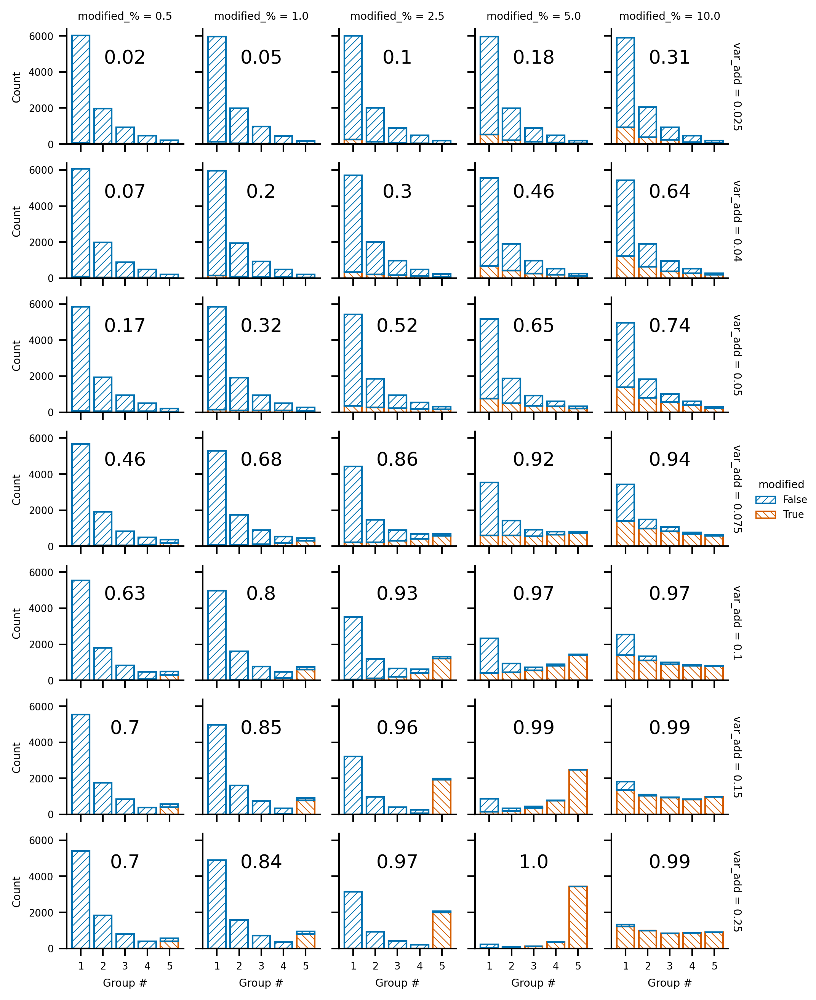

In [116]:
fg = plot_group_sizes(
    dataframes=variable_add_dfs,
    model_names=MODEL_NAMES,
    clean_data=synth_noisy_df,
    groups=np.arange(1, 6),
    group_stat="both",
    hue="modified",
    col="modified_%",
    row="var_add",
    height=1.25,
    aspect=1,
    add_catplot=False,
    plot_type="histplot",
    margin_titles=True,
)
plot_df = calc_stats_classification(
    dataframes=variable_add_dfs,
    clean_dataframe=synth_noisy_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2)
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.7,
            transform=ax.transAxes,
            fontdict={"fontsize": 12},
            ha="center",
        )
fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(180 / 25.4)
fg.tight_layout(rect=(0, 0, 0.93, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S20.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S20.eps")
print(fg.figure.get_size_inches())

Figure S21


[7.08661417 2.        ]


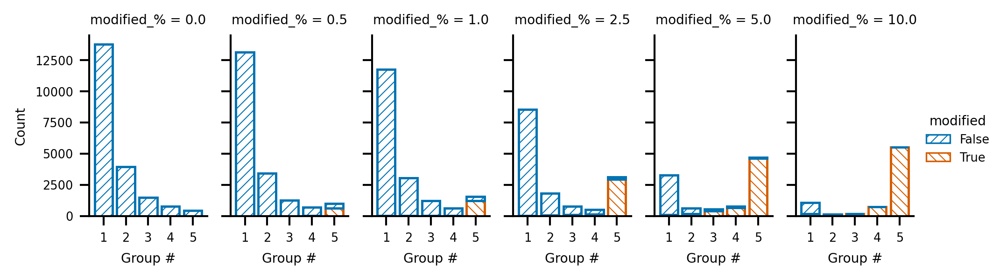

In [119]:
fg = plot_group_sizes(
    dataframes=qm9_shuffled_dfs,
    model_names=MODEL_NAMES,
    clean_data=qm9_clean,
    groups=np.arange(1, 6),
    group_stat="both",
    hue="modified",
    col="modified_%",
    row=None,
    height=2,
    aspect=0.75,
    add_catplot=False,
    plot_type="histplot",
)

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(180 / 25.4)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S21.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S21.eps")
print(fg.figure.get_size_inches())

Figure S22


[ 7. 10.]


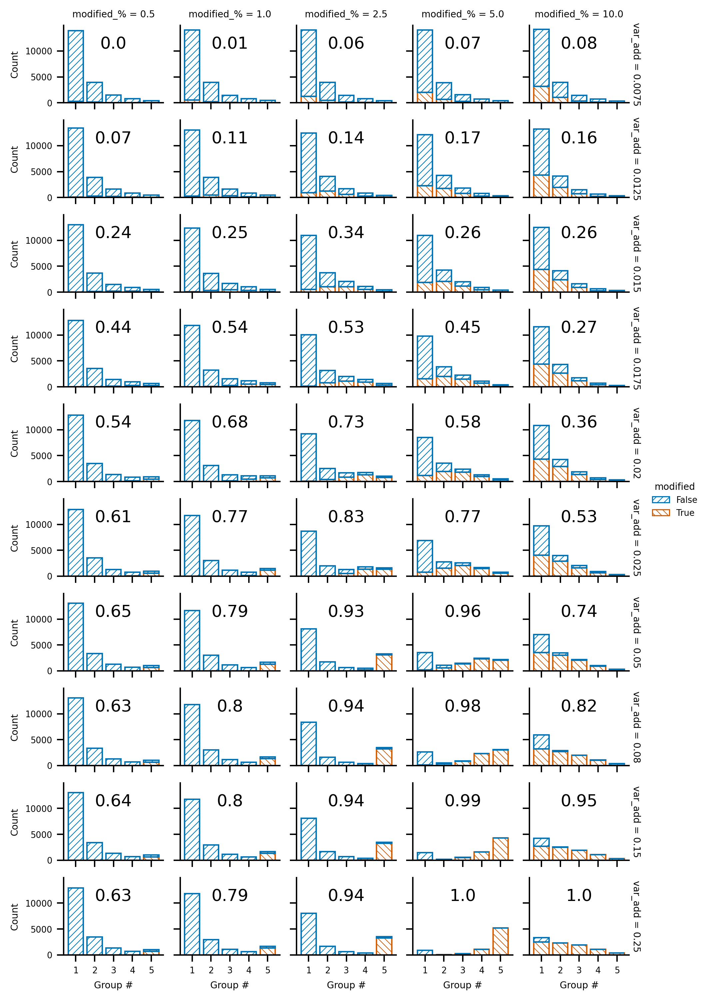

In [123]:
fg = plot_group_sizes(
    dataframes=qm9_var_add_dfs,
    model_names=MODEL_NAMES,
    clean_data=qm9_clean,
    groups=np.arange(1, 6),
    group_stat="both",
    hue="modified",
    col="modified_%",
    row="var_add",
    height=1.25,
    aspect=1,
    add_catplot=False,
    plot_type="histplot",
    margin_titles=True,
)

plot_df = calc_stats_classification(
    dataframes=qm9_var_add_dfs,
    clean_dataframe=qm9_clean,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2)
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.7,
            transform=ax.transAxes,
            fontdict={"fontsize": 12},
            ha="center",
        )

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout(rect=(0, 0, 0.93, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S22.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S22.eps")
print(fg.figure.get_size_inches())

Figure S23a


[3. 3.]


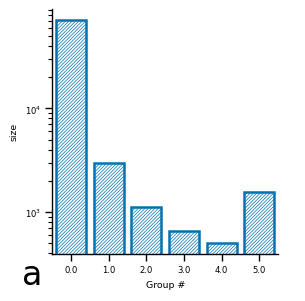

In [134]:
fg = plot_group_sizes(
    dataframes=metlin_df,
    model_names=metlin_models,
    value_name="EXP",
    thresholds=DEFAULT_THRESHOLD,
    add_catplot=False,
    group_stat="both",
    plot_type="barplot",
    col=None,
    row=None,
    hue=None,
    height=3,
    aspect=0.75,
)

for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)


handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)

fg.set(yscale="log")
fg.set_xlabels("Group #")
fg.figure.text(x=0.075, y=0.05, s="a", fontsize=24)
fg.figure.set_size_inches(3,3)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S23a.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S23a.eps")
print(fg.figure.get_size_inches())

Figure S23b


[3. 3.]


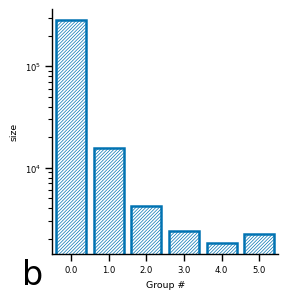

In [133]:
fg = plot_group_sizes(
    dataframes=nist_df,
    model_names=nist_models,
    value_name="RI_X",
    thresholds=DEFAULT_THRESHOLD,
    add_catplot=False,
    group_stat="both",
    plot_type="barplot",
    col=None,
    row=None,
    hue=None,
    aspect=0.75,
    height=3,
)
for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)


handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)

fg.set(yscale="log")
fg.set_xlabels("Group #")
fg.figure.text(x=0.075, y=0.05, s="b", fontsize=24)
fg.figure.set_size_inches(3,3)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S23b.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S23b.eps")
print(fg.figure.get_size_inches())

### Standard Deviation of Predictions as a Function of Group Number

Figure 5


[3.34645669 3.75      ]


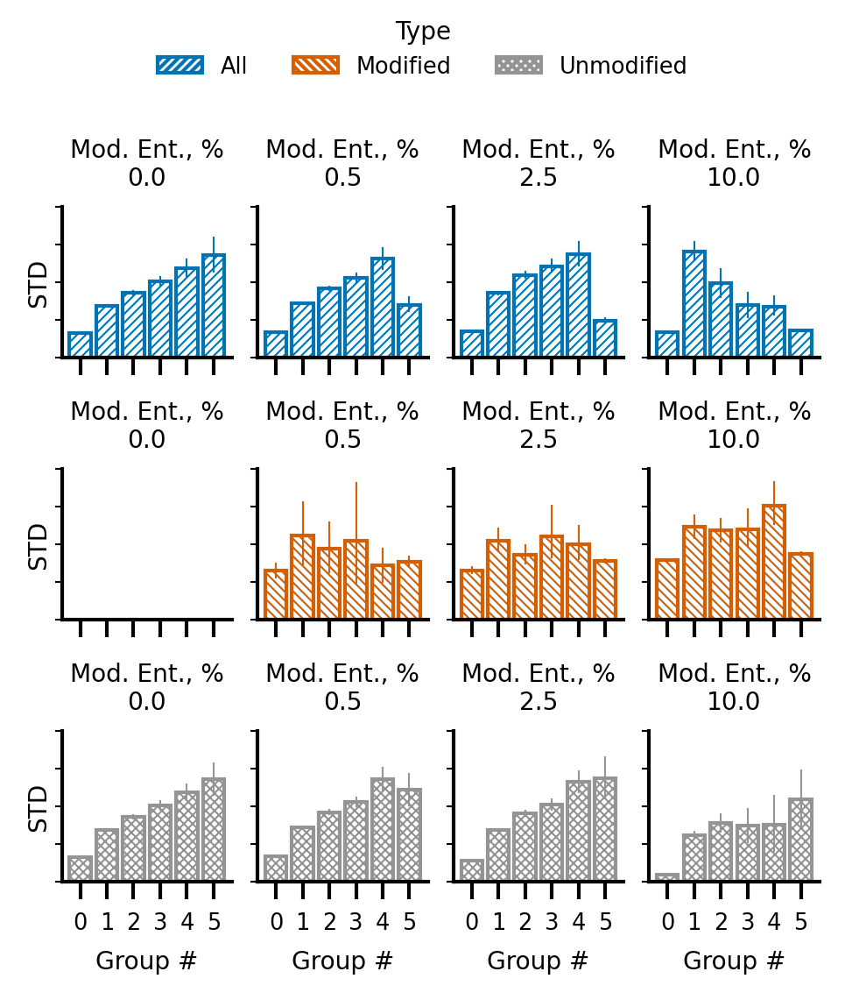

In [135]:
group_df = calc_stats_groups(
    dataframes=shuffled_dfs,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
)["s_5_b"]
basic_df = calc_stats_basic_prediction(
    dataframes=shuffled_dfs,
)["p_std"]
ground_truth = get_ground_truth(dataframes=shuffled_dfs, clean_dataframe=synth_noisy_df)
plot_df = pd.concat([group_df, basic_df, ground_truth], axis=1)
plot_df = plot_df.set_index("modified", append=True)
all_df = plot_df.copy()
mod_df = plot_df.xs(True, level="modified", drop_level=False)
unmod_df = plot_df.xs(False, level="modified", drop_level=False)
plot_df = plot_df.index.droplevel("modified")
plot_df = pd.concat(
    {
        "All": all_df,
        "Modified": mod_df,
        "Unmodified": unmod_df,
        #  "Unmodified": unmod_df
    },
    names=["Type"],
).reset_index()
plot_df = plot_df.iloc[np.isin(plot_df["modified_%"], [0, 0.5, 2.5, 10])]
plot_df.columns = ["Type", "Mod. Ent., %", "#", "m", "Group #", "STD"]
fg = sns.catplot(
    data=plot_df,
    x="Group #",
    y="STD",
    hue="Type",
    row="Type",
    kind="bar",
    col="Mod. Ent., %",
    fill=False,
    native_scale=True,
    dodge=False,
    # gap=0.4,
    palette="colorblind_reordered",
    linewidth=1,
    err_kws={"lw": 0.5},
    height=1.25,
    aspect=1,
    sharey=False,
)

for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)

handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)


sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var}\n{col_name}")
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.figure.set_dpi(300)
fg.figure.subplots_adjust(wspace=0.15)
fg.set_ylabels(labelpad=0)
fg.tick_params(axis="y", pad=1, width=0.5, length=2)

fg.savefig(BASE_DIR / "reports/figures/Figure_5.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_5.eps")

print(fg.figure.get_size_inches())

Figure 6


[3.34645669 4.        ]


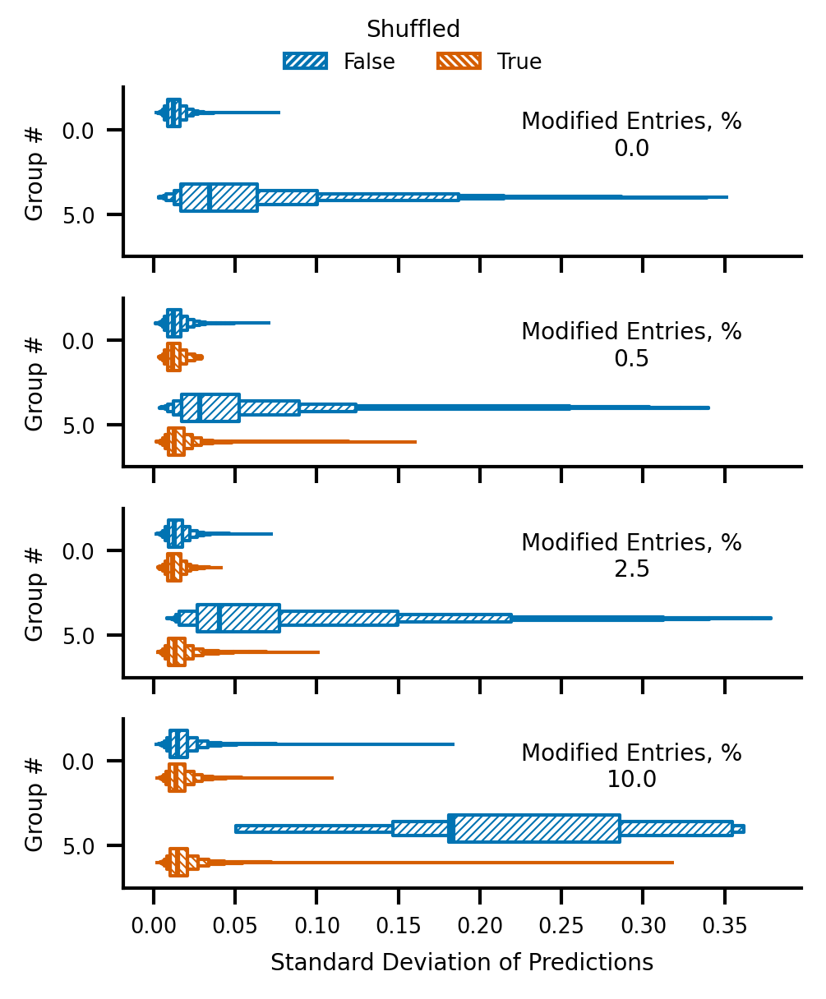

In [136]:
group_df = calc_stats_groups(
    dataframes=shuffled_dfs,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
)["s_5_b"]
basic_df = calc_stats_basic_prediction(
    dataframes=shuffled_dfs,
)["p_std"]
ground_truth = get_ground_truth(dataframes=shuffled_dfs, clean_dataframe=synth_noisy_df)
plot_df = pd.concat([group_df, basic_df, ground_truth], axis=1)
plot_df = plot_df.set_index("modified", append=True)
# all_df = plot_df.copy()
# mod_df = plot_df.xs(True,level="modified",drop_level=False)
# plot_df = pd.concat({"All": all_df, "Modified": mod_df}, names=["Type"])
plot_df = plot_df.reset_index()
plot_df = plot_df.loc[
    (np.isin(plot_df["s_5_b"], [0, 5]))
    & (np.isin(plot_df["modified_%"], [0, 0.5, 2.5, 10])),
    :,
]
plot_df.columns = [
    "Modified Entries, %",
    "#",
    "Shuffled",
    "Group #",
    "Standard Deviation of Predictions",
]
fg = sns.catplot(
    data=plot_df,
    y="Group #",
    x="Standard Deviation of Predictions",
    row="Modified Entries, %",
    hue="Shuffled",
    kind="boxen",
    orient="h",
    palette="colorblind_reordered",
    showfliers=False,
    k_depth="full",
    dodge=True,
    gap=0.2,
    # k_depth=5,
    fill=False,
    height=1,
    aspect=3,
    lw=1,
)

fg.set_titles(row_template="{row_var}\n{row_name}")
for ax in fg.axes.flatten():
    # print("Ax: ", ax)
    ax.text(
        s=ax.get_title(),
        x=0.75,
        y=0.6,
        transform=ax.transAxes,
        ha="center",
        fontdict={"fontsize": ax.title.get_fontsize()},
    )
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)
fg.set_titles(template="")
handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])


sns.move_legend(fg, "upper center", ncols=2)
fg.figure.set_figwidth(85 / 25.4)
# plt.subplots_adjust(right=0.9)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.savefig(BASE_DIR / "reports/figures/Figure_6.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_6.eps")
print(fg.figure.get_size_inches())

Figure S24


[7. 9.]


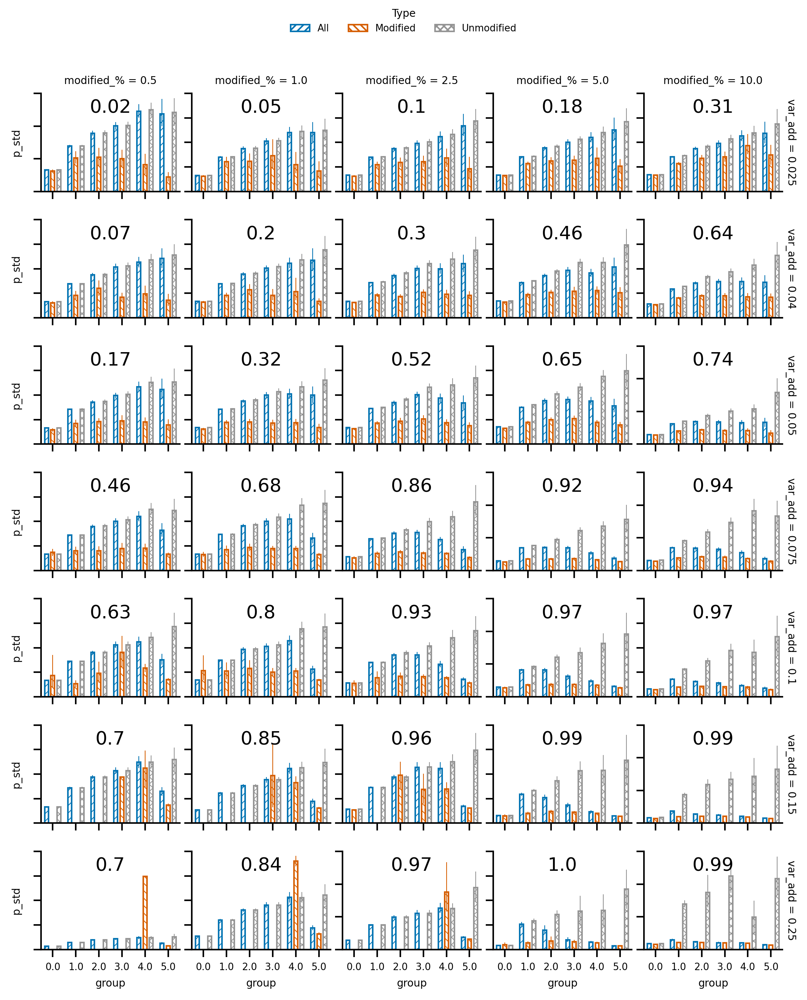

In [139]:
fg = plot_stats_group(
    dataframes=variable_add_dfs,
    model_names=MODEL_NAMES,
    clean_data=synth_noisy_df,
    mod_df_reference=True,
    split_modified=True,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="var_add",
    col="modified_%",
    hue="Type",
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
)
plot_df = calc_stats_classification(
    dataframes=variable_add_dfs,
    clean_dataframe=synth_noisy_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2)
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.8,
            transform=ax.transAxes,
            ha="center",
            fontsize=12,
        )


sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.savefig(BASE_DIR / "reports/figures/Figure_S24.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S24.eps")
print(fg.figure.get_size_inches())

Figure S25


[7. 5.]


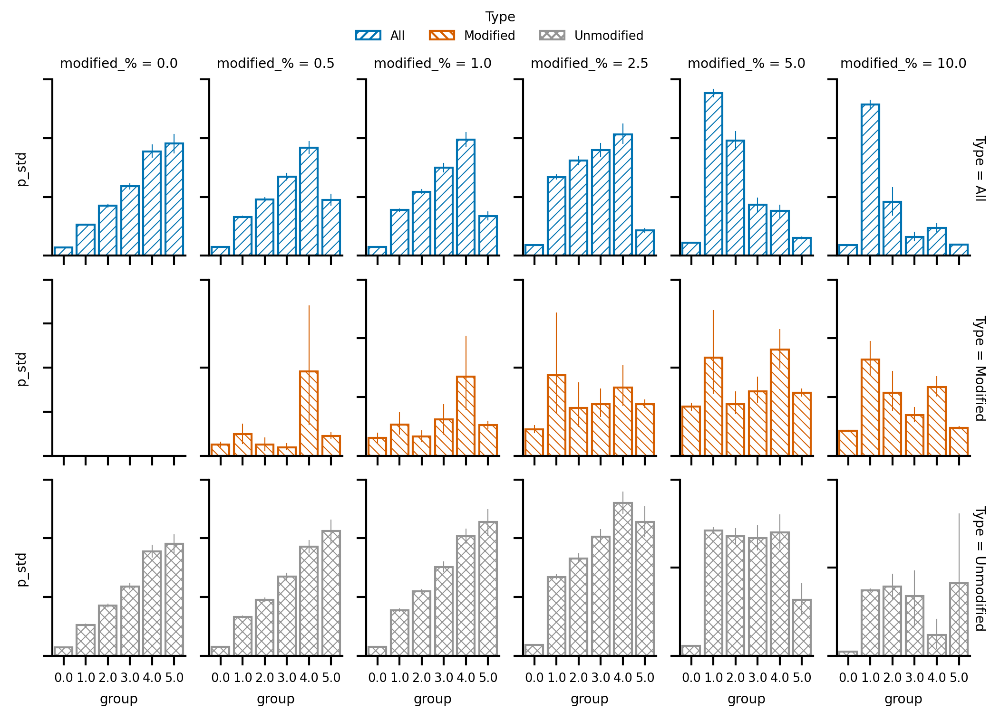

In [141]:
fg = plot_stats_group(
    dataframes=qm9_shuffled_dfs,
    model_names=MODEL_NAMES,
    clean_data=qm9_clean,
    mod_df_reference=True,
    split_modified=True,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="Type",
    col="modified_%",
    hue="Type",
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
    dodge=False,
)
sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.figure.set_size_inches(7, 5)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.savefig(BASE_DIR / "reports/figures/Figure_S25.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S25.eps")
print(fg.figure.get_size_inches())

Figure S26


[7. 9.]


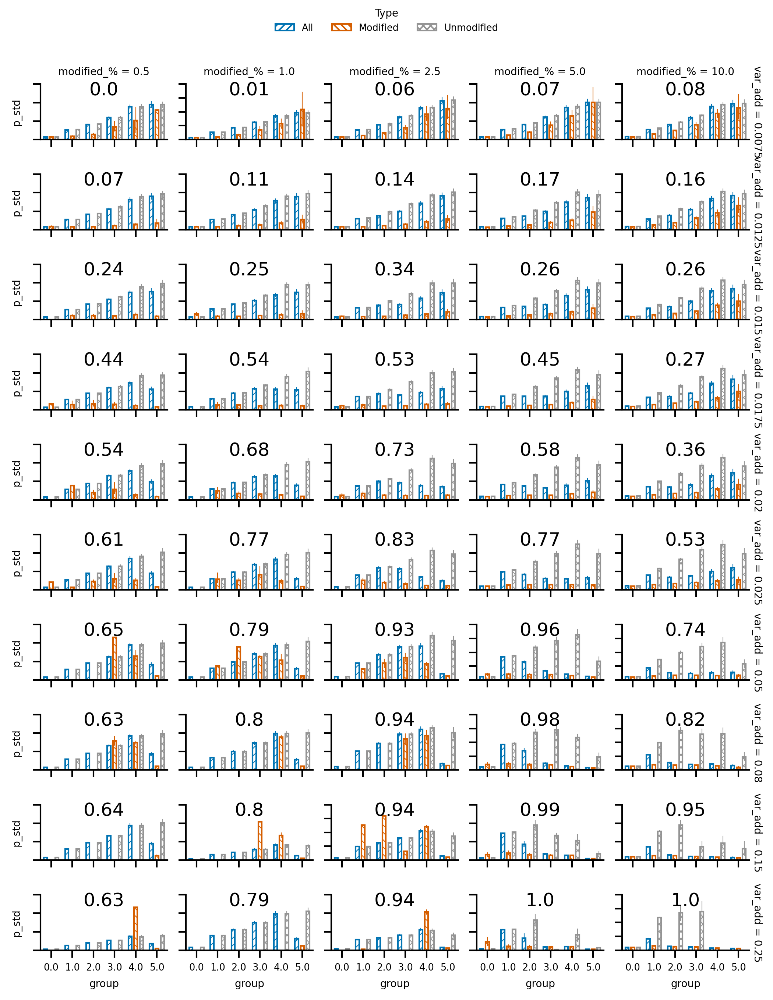

In [143]:
fg = plot_stats_group(
    dataframes=qm9_var_add_dfs,
    model_names=MODEL_NAMES,
    clean_data=qm9_clean,
    mod_df_reference=True,
    split_modified=True,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="var_add",
    col="modified_%",
    hue="Type",
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
    dodge=True,
)
plot_df = calc_stats_classification(
    dataframes=qm9_var_add_dfs,
    clean_dataframe=qm9_clean,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2)
)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.8,
            transform=ax.transAxes,
            ha="center",
            fontsize=12,
        )

sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.savefig(BASE_DIR / "reports/figures/Figure_S26.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S26.eps")
print(fg.figure.get_size_inches())

Figure S27

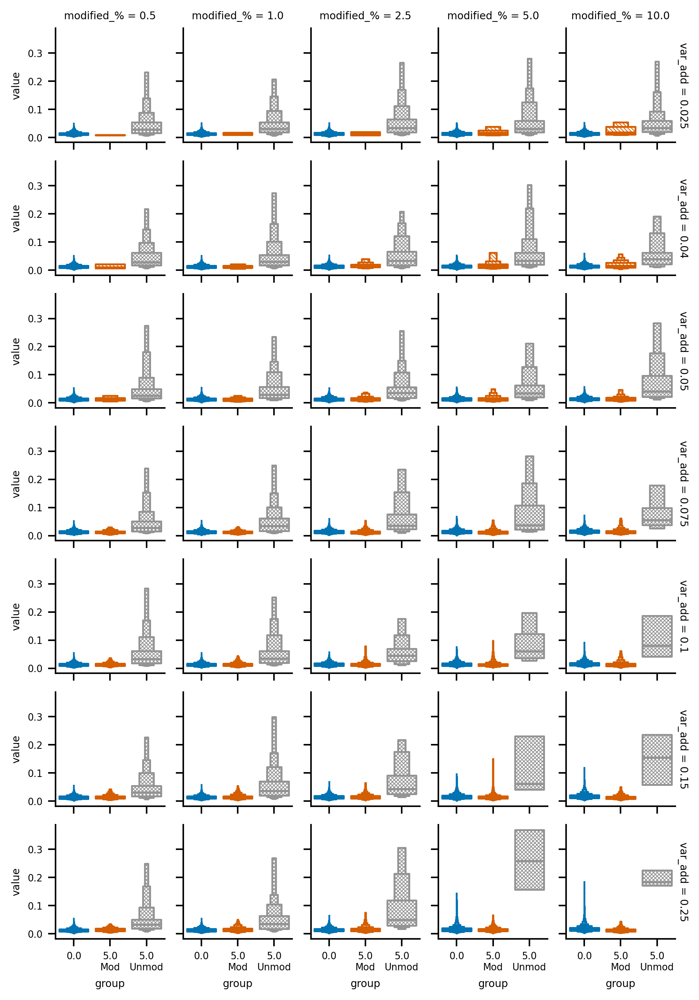

In [159]:
fg = plot_stats_group(
    dataframes=variable_add_dfs,
    model_names=MODEL_NAMES,
    clean_data=synth_noisy_df,
    stats="p_std",
    row="var_add",
    mod_df_reference=True,
    split_modified="last",
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    kind="catplot",
    hue="group",
    height=1.5,
    aspect=1,
    annot_sizes=False,
    margin_titles=True,
)

for ax in fg.axes.flatten():
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 0.9, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S27.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S27.eps")

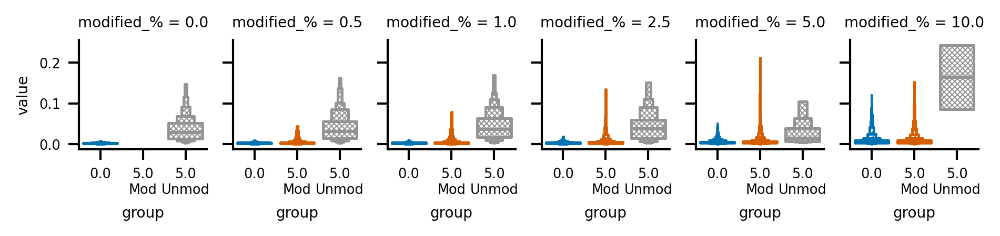

In [161]:
fg = plot_stats_group(
    dataframes=qm9_shuffled_dfs,
    model_names=MODEL_NAMES,
    clean_data=qm9_clean,
    stats="p_std",
    mod_df_reference=True,
    split_modified="last",
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    kind="catplot",
    hue="group",
    height=1.5,
    aspect=1,
    annot_sizes=False,
)
for ax in fg.axes.flatten():
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout(rect=(0, 0, 0.9, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S28.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S28.eps")

Figure S29


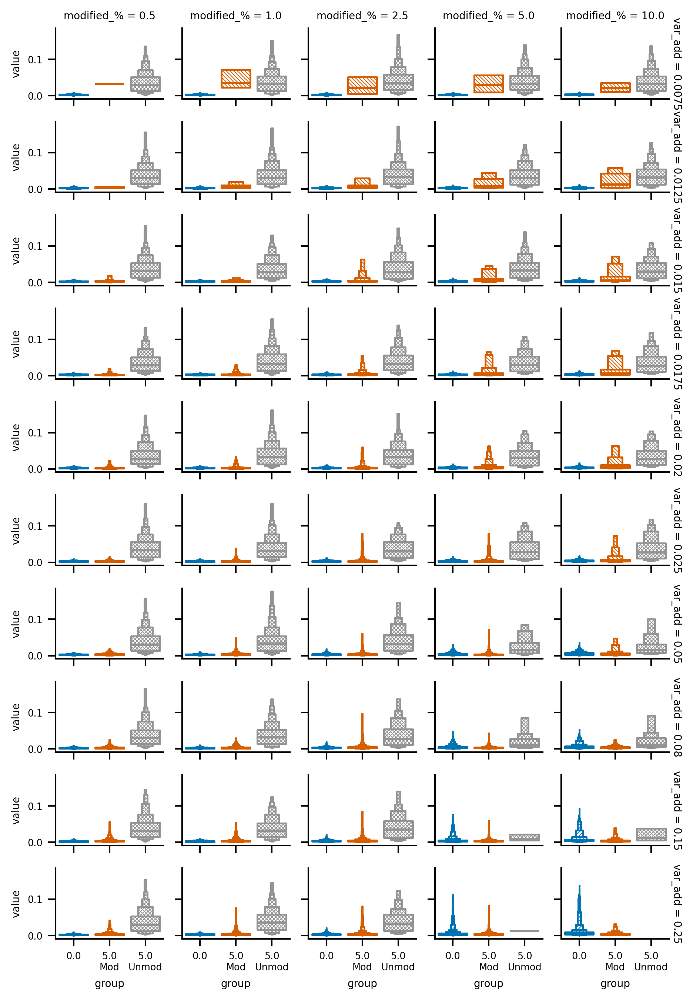

In [163]:
fg = plot_stats_group(
    dataframes=qm9_var_add_dfs,
    model_names=MODEL_NAMES,
    clean_data=qm9_clean,
    row="var_add",
    stats="p_std",
    mod_df_reference=True,
    split_modified="last",
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    kind="catplot",
    hue="group",
    height=1.5,
    aspect=1,
    annot_sizes=False,
    margin_titles=True,
)
for ax in fg.axes.flatten():
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 0.9, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S29.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S29.eps")

Figure S30


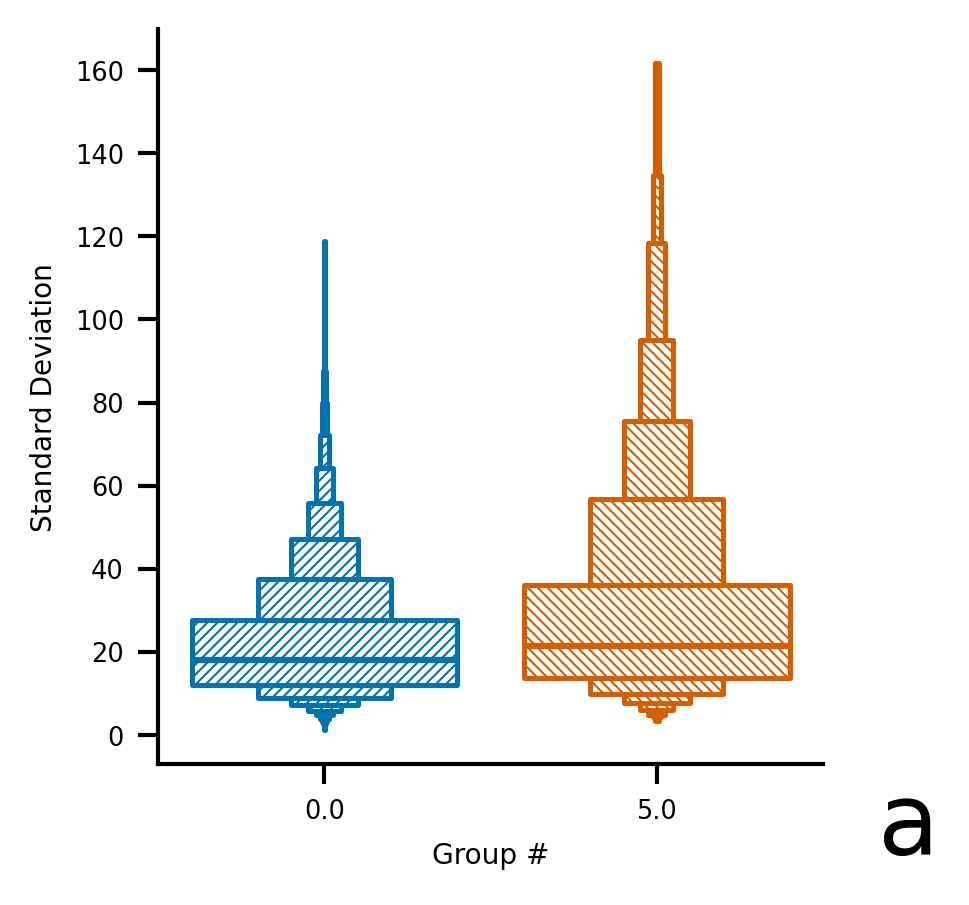

In [172]:
fg = plot_stats_group(
    dataframes=metlin_df,
    model_names=metlin_models,
    value_name="EXP",
    stats="p_std",
    mod_df_reference=True,
    split_modified=False,
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    groups=[0, 5],
    x_var="group",
    hue="group",
    col=None,
    row=None,
    annot_sizes=False,
    height=3,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.set_xlabel("")
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.set_ylabels("Standard Deviation")
fg.figure.text(x=0.875, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S30a.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S30a.eps")

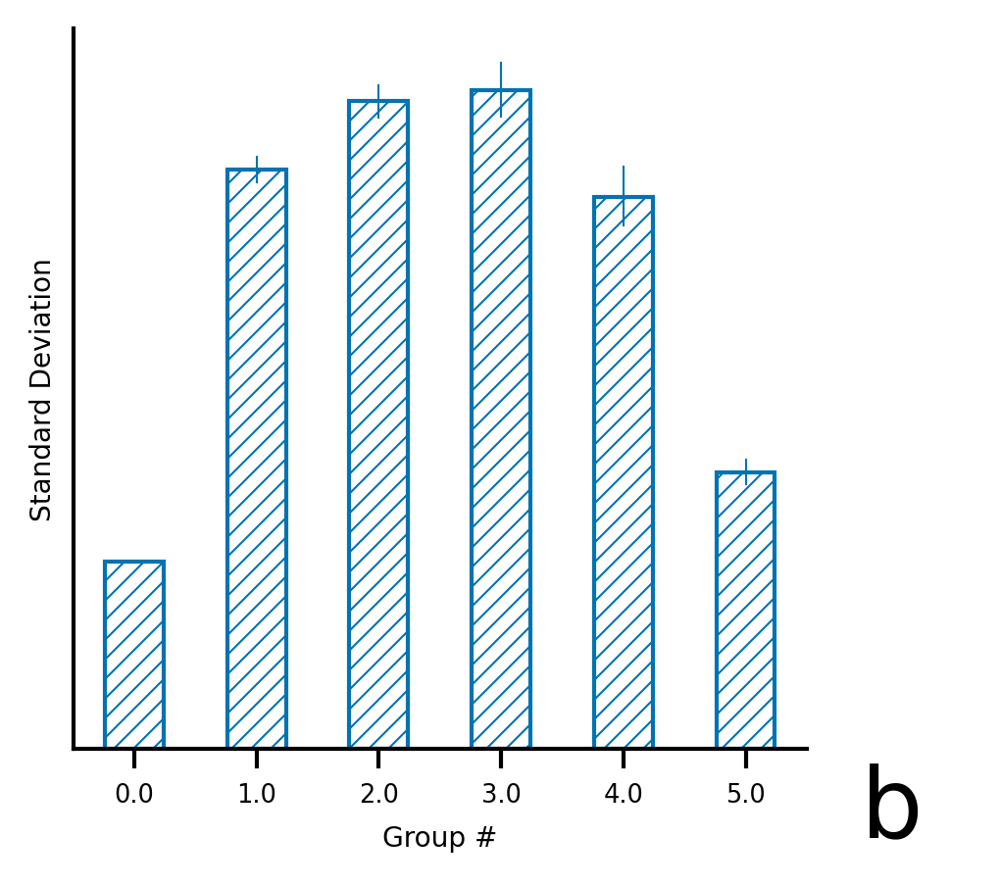

In [167]:
fg = plot_stats_group(
    dataframes=metlin_df,
    model_names=metlin_models,
    clean_data=None,
    value_name="EXP",
    stats="p_std",
    groups=np.arange(0, 6),
    mod_df_reference=True,
    kind="barplot",
    relplot_agg=True,
    x_var="group",
    y_var="p_std",
    hue=None,
    col=None,
    row=None,
    split_modified=False,
    annot_sizes=False,
    facet_kws=dict(sharey=False),
)
fg.figure.set_dpi(300)
fg.set_xlabels("Group #")
fg.set_ylabels("Standard Deviation")
fg.set(yticks=())
fg.figure.set_figwidth(85 / 25.4)
fg.figure.text(x=0.875, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S30b.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S30b.eps")

Figure S31


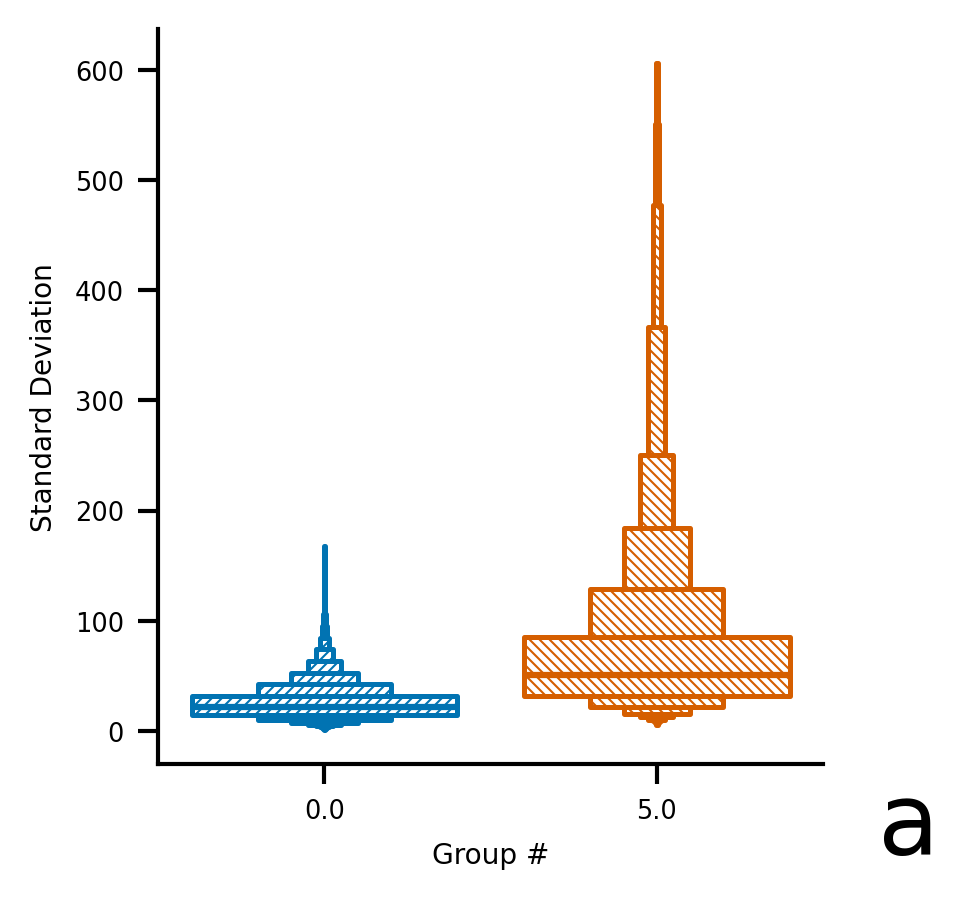

In [173]:
fg = plot_stats_group(
    dataframes=nist_df,
    model_names=nist_models,
    value_name="RI_X",
    stats="p_std",
    mod_df_reference=True,
    split_modified=False,
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    groups=[0, 5],
    x_var="group",
    hue="group",
    col=None,
    row=None,
    annot_sizes=False,
    height=3,
    aspect=1,
)
for ax in fg.axes.flatten():
    # print("Ax: ", ax)
    # ax.text(
    #     s=ax.get_title(),
    #     x=0.75,
    #     y=0.6,
    #     transform=ax.transAxes,
    #     ha="center",
    #     fontdict={"fontsize": ax.title.get_fontsize()},
    # )
    # ax.title.set_position((1.05, 0))
    ax.set_xlabel("")
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.set_ylabels("Standard Deviation")
fg.figure.text(x=0.875, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S31a.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S31a.eps")

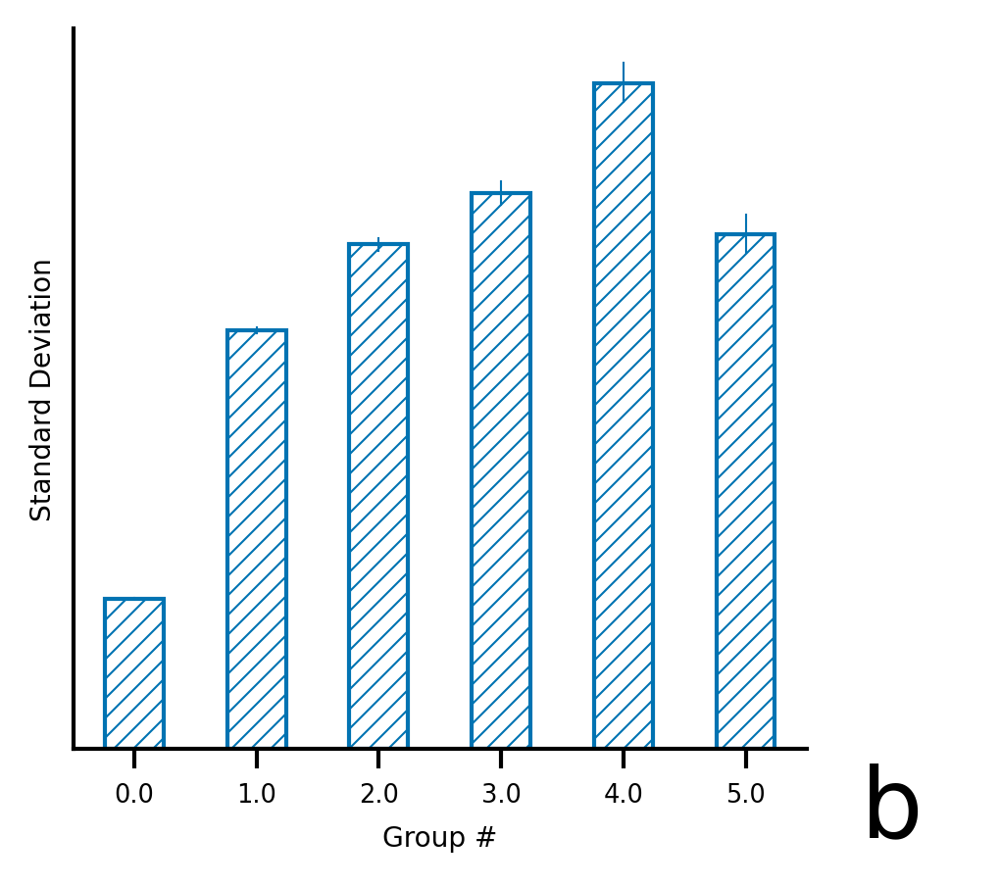

In [174]:
fg = plot_stats_group(
    dataframes=nist_df,
    model_names=nist_models,
    clean_data=None,
    value_name="RI_X",
    stats="p_std",
    groups=np.arange(0, 6),
    mod_df_reference=True,
    kind="barplot",
    relplot_agg=True,
    x_var="group",
    y_var="p_std",
    hue=None,
    col=None,
    row=None,
    split_modified=False,
    annot_sizes=False,
    facet_kws=dict(sharey=False),
)
fg.figure.set_dpi(300)
fg.set_xlabels("Group #")
fg.set_ylabels("Standard Deviation")
fg.set(yticks=())
fg.figure.set_figwidth(85 / 25.4)
fg.figure.text(x=0.875, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S31b.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S31b.eps")

### "Yellow cards" vs Simple Thresholding


Figure S32


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


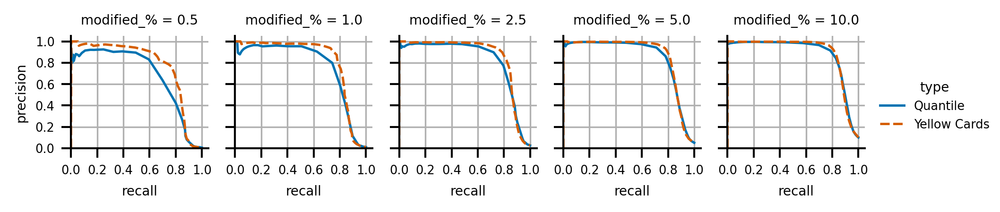

In [189]:
results = calc_stats_comparison(dataframes=shuffled_dfs, clean_data=synth_noisy_df)
fg = sns.relplot(
    data=results.loc[results["modified_%"] > 0],
    x="recall",
    y="precision",
    hue="type",
    style="type",
    col="modified_%",
    kind="line",
    markers=False,
    palette="colorblind_reordered",
    height=1.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(True)
fg.set(xlim=(0, 1.05))
fg.set(ylim=(0, 1.05))
fg.set(xticks=np.linspace(0, 1, 6))
fg.set(yticks=np.linspace(0, 1, 6))
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S32.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S32.eps")

Table 2


In [182]:
auc_results = []
for i in results["modified_%"].unique():
    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "recall"
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "precision"
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "yellow cards", round(auc(xs, ys), 3)))

    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "recall",
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "precision",
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "quant", round(auc(xs, ys), 3)))
plot_df = pd.DataFrame(auc_results).set_index([0, 1]).unstack(1)
plot_df

2             
1     quant yellow cards
0                       
0.0     NaN        0.000
0.5   0.688        0.776
1.0   0.772        0.820
2.5   0.825        0.853
5.0   0.851        0.865
10.0  0.883        0.890

In [187]:
auc_results = []
for i in results["modified_%"].unique():
    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "recall"
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "precision"
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "yellow cards", round(auc(xs, ys), 3)))


    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "recall",
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "precision",
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "quant", round(auc(xs, ys), 3)))
plot_df = pd.DataFrame(auc_results).set_index([0, 1]).unstack(1)
plot_df

2             
1     quant yellow cards
0                       
0.0     NaN        0.000
0.5   0.856        0.892
1.0   0.905        0.931
2.5   0.945        0.960
5.0   0.958        0.963
10.0  0.971        0.969

Figure S34


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


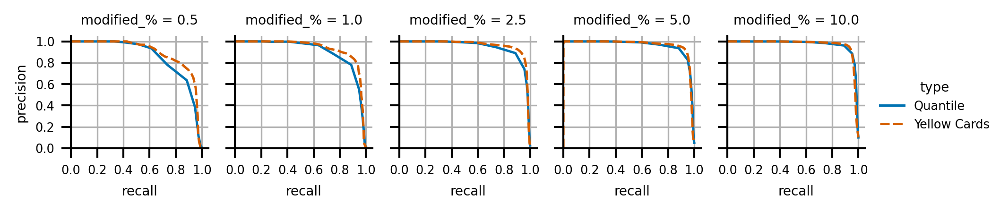

In [188]:
results = calc_stats_comparison(dataframes=qm9_shuffled_dfs, clean_data=qm9_clean)
fg = sns.relplot(
    data=results.loc[results["modified_%"] > 0],
    x="recall",
    y="precision",
    hue="type",
    style="type",
    col="modified_%",
    kind="line",
    markers=False,
    palette="colorblind_reordered",
    height=1.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(True)
fg.set(xlim=(0, 1.05))
fg.set(ylim=(0, 1.05))
fg.set(xticks=np.linspace(0, 1, 6))
fg.set(yticks=np.linspace(0, 1, 6))
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S33.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S33.eps")